In [1]:
library(Signac)
library(Seurat)
library(GenomeInfoDb)
library(EnsDb.Hsapiens.v86)
library(ggplot2)
library(dplyr)
library(rtracklayer)
set.seed(1234)
source('./Function_scRNA.R')

Attaching SeuratObject

Seurat v4 was just loaded with SeuratObject v5; disabling v5 assays and
validation routines, and ensuring assays work in strict v3/v4
compatibility mode

载入需要的程辑包：BiocGenerics


载入程辑包：‘BiocGenerics’


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, rownames, sapply, setdiff, sort,
    table, tapply, union, unique, unsplit, which.max, which.min


载入需要的程辑包：S4Vectors

载入需要的程辑包：stats4


载入程辑包：‘S4Vectors’


The following object is masked from ‘package:utils’:

    findMatches


The following objects are

In [8]:
src_dir <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/matrix"
dst_dir <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/peak"

files <- list.files(src_dir, full.names = TRUE)
sample_names <- unique(sub("\\..*", "", basename(files)))  # 关键是这一行

for (sample in sample_names) {
  sample_dir <- file.path(dst_dir, sample)
  if (!dir.exists(sample_dir)) dir.create(sample_dir, recursive = TRUE)
  sample_files <- files[grepl(paste0("^", sample, "\\."), basename(files))]
  for (f in sample_files) {
    file.rename(f, file.path(sample_dir, basename(f)))
  }
}

In [10]:
#给每一个fragment文件生成tbi
fragment_dir <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/fragment/"
fragment_files <- list.files(fragment_dir, pattern = "\\.fragments.tsv.gz$", full.names = TRUE)
for (f in fragment_files) {
  system(paste("tabix -p bed", shQuote(f)))
}

fragment_dir <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/fragment/"
fragment_files <- list.files(fragment_dir, pattern = "\\.fragments.tsv.gz$", full.names = TRUE)

In [11]:
length(fragment_files)

[1] 39

In [2]:
Create_scATAC_object <- function(barcodes_file=NULL,fragment_file=NULL,peaks=NULL){
    cell <- readLines(barcodes_file)
    frags <- CreateFragmentObject(path = fragment_file, cells = cell)
    counts <- FeatureMatrix(fragments = frags,features = peaks,cells = cell)
    #
    atac.assay <- CreateChromatinAssay(counts, fragments = frags)
    atac.obj <- CreateSeuratObject(atac.assay, assay = "ATAC")
    #
    return (atac.obj)
}

In [13]:
library(Signac)
library(Seurat)
library(Matrix)
library(GenomeInfoDb)
library(EnsDb.Hsapiens.v86)
library(scDblFinder)

matrix_dir <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/peak"
fragment_dir <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/fragment"
qc_path <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc_/"
rds_path <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_rds_redo/"

# 注释
annotations <- GetGRangesFromEnsDb(ensdb = EnsDb.Hsapiens.v86)
seqlevelsStyle(annotations) <- "UCSC"
genome(annotations) <- "hg38"

# 直接读取本地 ENCODE blacklist regions（人类hg38）
blacklist_hg38 <- rtracklayer::import("/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/hg38-blacklist.v2.bed")
seqlevelsStyle(blacklist_hg38) <- "UCSC"
genome(blacklist_hg38) <- "hg38"

sample_dirs <- list.dirs(matrix_dir, recursive = FALSE)
sample_names <- basename(sample_dirs)

Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warn

In [15]:
for (i in seq_along(sample_names)) {
  sample_name <- sample_names[i]
  data_path <- file.path(matrix_dir, sample_name)
  fragment_file <- file.path(fragment_dir, paste0(sample_name, ".fragments.tsv.gz"))
  barcodes_file <- file.path(data_path, paste0(sample_name, ".barcodes.tsv"))
  peaks_file <- file.path(data_path, paste0(sample_name, ".peaks.bed"))

  cat("正在处理：", sample_name, "\n")

  # 用 rtracklayer::import 读取标准 BED 格式
  peaks_gr <- rtracklayer::import(peaks_file)

  atac_obj <- Create_scATAC_object(
    barcodes_file = barcodes_file,
    fragment_file = fragment_file,
    peaks = peaks_gr
  )
  atac_obj$orig.ident <- sample_name

  # 添加注释
  Annotation(atac_obj) <- annotations

  # 计算QC指标
  atac_obj <- NucleosomeSignal(atac_obj)
  atac_obj <- TSSEnrichment(atac_obj)

  # 统计每个细胞总片段数
  total_fragments <- CountFragments(fragment_file)
  total_fragments <- subset(total_fragments, total_fragments$CB %in% colnames(atac_obj))
  row.names(total_fragments) <- total_fragments$CB
  atac_obj$fragments <- total_fragments[colnames(atac_obj), "frequency_count"]

  # 计算FRiP
  atac_obj <- FRiP(object = atac_obj, assay = 'ATAC', total.fragments = 'fragments')

  # 计算blacklist_fraction
  atac_obj$blacklist_fraction <- FractionCountsInRegion(
    object = atac_obj,
    assay = "ATAC",
    regions = blacklist_hg38
  )
  atac_obj <- runscDblFinder(atac_obj, assay = 'ATAC')

  # 保存meta信息和Seurat对象
  write.csv(atac_obj@meta.data, file.path(qc_path, paste0(sample_name, "_meta.csv")), quote = FALSE)
  saveRDS(atac_obj, file = file.path(rds_path, paste0(sample_name, "_atac.rds")))
  cat("完成：", sample_name, "\n")
}

正在处理： GSM8650243_108 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 3223750)"
Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 3223750)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~5298 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 654 cells excluded from training.

iter=1, 654 cells excluded from training.

iter=2, 658 cells excluded from training.

Threshold f

完成： GSM8650243_108 
正在处理： GSM8650244_109 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
8 clusters

Creating ~7069 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 1091 cells excluded from training.

iter=1, 1093 cells excluded from training.

iter=2, 1108 cells excluded from training.

Threshold found:0.577

1139 (12.9%) doublets called



完成： GSM8650244_109 
正在处理： GSM8650245_110 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 3456350)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~3392 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 309 cells excluded from training.

iter=1, 324 cells excluded from training.

iter=2, 309 cells excluded from training.

Threshold found:0.559

320 (7.5%) doublets called



完成： GSM8650245_110 
正在处理： GSM8650246_111 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2968050)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~3263 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 298 cells excluded from training.

iter=1, 303 cells excluded from training.

iter=2, 312 cells excluded from training.

Threshold found:0.612

327 (8%) doublets called



完成： GSM8650246_111 
正在处理： GSM8650247_113 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~6101 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 820 cells excluded from training.

iter=1, 804 cells excluded from training.

iter=2, 789 cells excluded from training.

Threshold found:0.467

834 (10.9%) doublets called



完成： GSM8650247_113 
正在处理： GSM8650248_114 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 3128100)"
Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 3128100)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~3145 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 279 cells excluded from training.

iter=1, 254 cells excluded from training.

iter=2, 248 cells excluded from training.

Threshold found:0.489

272 (6.9%) doublets called



完成： GSM8650248_114 
正在处理： GSM8650249_115 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 4994350)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
8 clusters

Creating ~11840 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 1783 cells excluded from training.

iter=1, 1902 cells excluded from training.

iter=2, 1935 cells excluded from training.

Threshold found:0.434

2089 (14.1%) doublets called



完成： GSM8650249_115 
正在处理： GSM8650250_134 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2725950)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~4305 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 492 cells excluded from training.

iter=1, 520 cells excluded from training.

iter=2, 526 cells excluded from training.

Threshold found:0.734

577 (10.7%) doublets called



完成： GSM8650250_134 
正在处理： GSM8650251_144 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2421450)"
Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2421450)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~3054 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 270 cells excluded from training.

iter=1, 300 cells excluded from training.

iter=2, 323 cells excluded from training.

Threshold f

完成： GSM8650251_144 
正在处理： GSM8650252_147 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 3429350)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~2322 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 166 cells excluded from training.

iter=1, 170 cells excluded from training.

iter=2, 172 cells excluded from training.

Threshold found:0.843

192 (6.6%) doublets called



完成： GSM8650252_147 
正在处理： GSM8650253_148 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2239450)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~5320 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 711 cells excluded from training.

iter=1, 763 cells excluded from training.

iter=2, 787 cells excluded from training.

Threshold found:0.764

815 (12.3%) doublets called



完成： GSM8650253_148 
正在处理： GSM8650254_151 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2445100)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~3196 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 276 cells excluded from training.

iter=1, 296 cells excluded from training.

iter=2, 295 cells excluded from training.

Threshold found:0.785

324 (8.1%) doublets called



完成： GSM8650254_151 
正在处理： GSM8650255_165 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
5 clusters

Creating ~1849 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 117 cells excluded from training.

iter=1, 114 cells excluded from training.

iter=2, 123 cells excluded from training.

Threshold found:0.613

123 (5.3%) doublets called



完成： GSM8650255_165 
正在处理： GSM8650256_166 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
5 clusters

Creating ~2732 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 178 cells excluded from training.

iter=1, 198 cells excluded from training.

iter=2, 194 cells excluded from training.

Threshold found:0.529

213 (6.2%) doublets called



完成： GSM8650256_166 
正在处理： GSM8650257_167 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~3763 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 357 cells excluded from training.

iter=1, 372 cells excluded from training.

iter=2, 366 cells excluded from training.

Threshold found:0.591

370 (7.9%) doublets called



完成： GSM8650257_167 
正在处理： GSM8650258_170 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
8 clusters

Creating ~7730 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 954 cells excluded from training.

iter=1, 976 cells excluded from training.

iter=2, 1047 cells excluded from training.

Threshold found:0.444

1193 (12.3%) doublets called



完成： GSM8650258_170 
正在处理： GSM8650259_172 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 5565550)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
11 clusters

Creating ~12412 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 1781 cells excluded from training.

iter=1, 1699 cells excluded from training.

iter=2, 1639 cells excluded from training.

Threshold found:0.439

1962 (12.6%) doublets called



完成： GSM8650259_172 
正在处理： GSM8650260_207 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
8 clusters

Creating ~4142 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 325 cells excluded from training.

iter=1, 315 cells excluded from training.

iter=2, 307 cells excluded from training.

Threshold found:0.385

356 (6.9%) doublets called



完成： GSM8650260_207 
正在处理： GSM8650261_208 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 6852500)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
9 clusters

Creating ~6586 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 879 cells excluded from training.

iter=1, 882 cells excluded from training.

iter=2, 886 cells excluded from training.

Threshold found:0.426

908 (11%) doublets called



完成： GSM8650261_208 
正在处理： GSM8650262_210 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
9 clusters

Creating ~6416 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 903 cells excluded from training.

iter=1, 908 cells excluded from training.

iter=2, 895 cells excluded from training.

Threshold found:0.449

986 (12.3%) doublets called



完成： GSM8650262_210 
正在处理： GSM8650263_212 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 3263300)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
9 clusters

Creating ~8524 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 1133 cells excluded from training.

iter=1, 1255 cells excluded from training.

iter=2, 1271 cells excluded from training.

Threshold found:0.481

1391 (13.1%) doublets called



完成： GSM8650263_212 
正在处理： GSM8650264_215 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~5928 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 668 cells excluded from training.

iter=1, 769 cells excluded from training.

iter=2, 748 cells excluded from training.

Threshold found:0.564

812 (11%) doublets called



完成： GSM8650264_215 
正在处理： GSM8650265_218 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
10 clusters

Creating ~6177 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 628 cells excluded from training.

iter=1, 593 cells excluded from training.

iter=2, 574 cells excluded from training.

Threshold found:0.381

634 (8.2%) doublets called



完成： GSM8650265_218 
正在处理： GSM8650266_245 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 4754150)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
10 clusters

Creating ~6939 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 767 cells excluded from training.

iter=1, 773 cells excluded from training.

iter=2, 770 cells excluded from training.

Threshold found:0.427

875 (10.1%) doublets called



完成： GSM8650266_245 
正在处理： GSM8650267_413 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~6420 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 747 cells excluded from training.

iter=1, 762 cells excluded from training.

iter=2, 747 cells excluded from training.

Threshold found:0.406

823 (10.3%) doublets called



完成： GSM8650267_413 
正在处理： GSM8650268_414 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~2165 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 125 cells excluded from training.

iter=1, 145 cells excluded from training.

iter=2, 145 cells excluded from training.

Threshold found:0.608

145 (5.4%) doublets called



完成： GSM8650268_414 
正在处理： GSM8650269_415 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 1717600)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~4555 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 528 cells excluded from training.

iter=1, 557 cells excluded from training.

iter=2, 554 cells excluded from training.

Threshold found:0.698

575 (10.1%) doublets called



完成： GSM8650269_415 
正在处理： GSM8650270_416 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 1683000)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
8 clusters

Creating ~5224 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 432 cells excluded from training.

iter=1, 512 cells excluded from training.

iter=2, 526 cells excluded from training.

Threshold found:0.481

611 (9.4%) doublets called



完成： GSM8650270_416 
正在处理： GSM8650271_417 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~1500 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 72 cells excluded from training.

iter=1, 70 cells excluded from training.

iter=2, 74 cells excluded from training.

Threshold found:0.686

76 (4.7%) doublets called



完成： GSM8650271_417 
正在处理： GSM8650272_418 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 3129300)"
Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 3129300)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~8358 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 1379 cells excluded from training.

iter=1, 1203 cells excluded from training.

iter=2, 1178 cells excluded from training.

Threshol

完成： GSM8650272_418 
正在处理： GSM8650273_419 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 4209400)"
Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 4209400)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~7916 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 1304 cells excluded from training.

iter=1, 1350 cells excluded from training.

iter=2, 1378 cells excluded from training.

Threshol

完成： GSM8650273_419 
正在处理： GSM8650274_562 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 5544500)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~3504 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 338 cells excluded from training.

iter=1, 355 cells excluded from training.

iter=2, 347 cells excluded from training.

Threshold found:0.676

362 (8.3%) doublets called



完成： GSM8650274_562 
正在处理： GSM8650275_563 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2258550)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~2943 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 266 cells excluded from training.

iter=1, 255 cells excluded from training.

iter=2, 262 cells excluded from training.

Threshold found:0.675

263 (7.2%) doublets called



完成： GSM8650275_563 
正在处理： GSM8650276_564 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2448050)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~6379 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 581 cells excluded from training.

iter=1, 817 cells excluded from training.

iter=2, 875 cells excluded from training.

Threshold found:0.581

912 (11.4%) doublets called



完成： GSM8650276_564 
正在处理： GSM8650277_567 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2783050)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~3202 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 259 cells excluded from training.

iter=1, 292 cells excluded from training.

iter=2, 297 cells excluded from training.

Threshold found:0.615

318 (7.9%) doublets called



完成： GSM8650277_567 
正在处理： GSM8650278_574 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
8 clusters

Creating ~5068 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 596 cells excluded from training.

iter=1, 631 cells excluded from training.

iter=2, 617 cells excluded from training.

Threshold found:0.598

643 (10.2%) doublets called



完成： GSM8650278_574 
正在处理： GSM8650279_67 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~5930 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 741 cells excluded from training.

iter=1, 860 cells excluded from training.

iter=2, 863 cells excluded from training.

Threshold found:0.664

880 (11.9%) doublets called



完成： GSM8650279_67 
正在处理： GSM8650280_68 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
6 clusters

Creating ~6009 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 861 cells excluded from training.

iter=1, 878 cells excluded from training.

iter=2, 883 cells excluded from training.

Threshold found:0.686

952 (12.7%) doublets called



完成： GSM8650280_68 
正在处理： GSM8650281_69 


Computing hash

Extracting reads overlapping genomic regions

Extracting TSS positions

Extracting fragments at TSSs


Computing TSS enrichment score

Calculating fraction of reads in peaks per cell

Warning message in .checkSCE(sce):
"Some cells in `sce` have an extremely low read counts; note that these could trigger errors and might best be filtered out"
Aggregating features...

Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2970850)"
Warning message:
"Quick-TRANSfer stage steps exceeded maximum (= 2970850)"
Clustering cells...

Warning message in (function (A, nv = 5, nu = nv, maxit = 1000, work = nv + 7, reorth = TRUE, :
"You're computing too large a percentage of total singular values, use a standard svd instead."
7 clusters

Creating ~8260 artificial doublets...

Dimensional reduction

Evaluating kNN...

Training model...

iter=0, 1354 cells excluded from training.

iter=1, 1480 cells excluded from training.

iter=2, 1474 cells excluded from training.

Threshol

完成： GSM8650281_69 


In [1]:
# detect outliers by MAD method
is_outlier <- function(dataframe, metric=NULL, nmads=NULL) {
  # Check if metric is a valid column name
  if (!metric %in% colnames(dataframe)) {
    stop("metric must be a valid column name")
  }
  # Get the values of the metric column
  M <- dataframe[,metric]
  
  # Calculate the median of the M values
  median <- median(M)

  # Calculate the MAD of the M values
  mad <- mad(M)

  # Check if any of the M values are more than nmads MADs away from the median
  outlier <- (M < median - nmads * mad) | (median + nmads * mad < M)

  # Return the outlier vector
  return(outlier)
}

In [18]:
meta_files <- list.files('/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc/', full.names = TRUE, pattern = "\\.csv$")

In [19]:
length(meta_files)

[1] 39

In [46]:
meta_datas=data.frame()
for (i in 1:length(meta_files)){
    cat(sprintf("Trying to read file: %s\n", meta_files[i]))
    meta_data=read.csv(meta_files[i], row.names=1)
    meta_datas=rbind(meta_datas,meta_data)
}

Trying to read file: /media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc//GSM8650243_108_meta.csv
Trying to read file: /media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc//GSM8650244_109_meta.csv
Trying to read file: /media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc//GSM8650245_110_meta.csv
Trying to read file: /media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc//GSM8650246_111_meta.csv
Trying to read file: /media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc//GSM8650247_113_meta.csv
Trying to read file: /media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc//GSM8650248_114_meta.csv
Trying to read file: /media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc//GSM8650249_115_meta.csv
Trying to read file: /media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc//GSM8650250_134_meta.csv
Trying to read file: /media/AnalysisTempDisk/Caipengfei/

In [48]:
dim(meta_datas)

[1] 260890     12

In [49]:
colnames(meta_datas)

[1] "orig.ident"            "nCount_ATAC"           "nFeature_ATAC"        
 [4] "nucleosome_signal"     "nucleosome_percentile" "TSS.enrichment"       
 [7] "TSS.percentile"        "fragments"             "FRiP"                 
[10] "blacklist_fraction"    "scDblFinder.class"     "scDblFinder.score"

In [50]:
meta_datas <- subset(meta_datas, nCount_ATAC > 0)

In [51]:
meta_datas

,orig.ident,nCount_ATAC,nFeature_ATAC,nucleosome_signal,nucleosome_percentile,TSS.enrichment,TSS.percentile,fragments,FRiP,blacklist_fraction,scDblFinder.class,scDblFinder.score
,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<dbl>
AAACGAAAGCCCATTA-1,GSM8650243_108,4986,4207,0.3889993,0.45,5.912065,0.29,10011,0.4980521,0.008624148,singlet,0.023005020
AAACGAAAGTGTCGCC-1,GSM8650243_108,1598,1456,0.4472441,0.75,6.141227,0.36,4725,0.3382011,0.007509387,singlet,0.081620157
AAACGAACAAATGTCC-1,GSM8650243_108,3545,3064,0.3354471,0.17,6.781836,0.60,9372,0.3782544,0.009873061,singlet,0.004982802
AAACGAAGTACAACGG-1,GSM8650243_108,2901,2533,0.4211663,0.63,7.590212,0.83,5893,0.4922790,0.009651844,singlet,0.009515670
AAACGAAGTGCAACAG-1,GSM8650243_108,4166,3649,0.3425926,0.20,6.422610,0.47,14972,0.2782527,0.005760922,singlet,0.006229762
AAACGAATCCAACCTC-1,GSM8650243_108,1086,1013,0.4185393,0.62,6.384525,0.45,2351,0.4619311,0.012891344,singlet,0.005854310
AAACGAATCGCAAGCC-1,GSM8650243_108,2645,2347,0.4783198,0.84,8.396731,0.94,5218,0.5068992,0.009829868,singlet,0.023023149
AAACGAATCTCTGCGT-1,GSM8650243_108,2990,2643,0.3173432,0.11,6.566249,0.52,5807,0.5148958,0.006354515,singlet,0.259914428
AAACTCGAGATGTTGA-1,GSM8650243_108,4075,3534,0.4169708,0.61,7.570581,0.83,6839,0.5958473,0.010552147,singlet,0.201008707


In [52]:
# re-compute outliers using MAD
outlier <- is_outlier(meta_datas, "nCount_ATAC", 4) | 
           is_outlier(meta_datas, "TSS.enrichment", 4) | 
           is_outlier(meta_datas, "FRiP", 4)
meta_datas$outlier <- outlier

In [24]:
meta_datas

,orig.ident,nCount_ATAC,nFeature_ATAC,nucleosome_signal,nucleosome_percentile,TSS.enrichment,TSS.percentile,fragments,FRiP,blacklist_fraction,scDblFinder.class,scDblFinder.score,outlier
,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>
AAACGAAAGCCCATTA-1,GSM8650243_108,4986,4207,0.3889993,0.45,5.912065,0.29,10011,0.4980521,0.008624148,singlet,0.023005020,FALSE
AAACGAAAGTGTCGCC-1,GSM8650243_108,1598,1456,0.4472441,0.75,6.141227,0.36,4725,0.3382011,0.007509387,singlet,0.081620157,FALSE
AAACGAACAAATGTCC-1,GSM8650243_108,3545,3064,0.3354471,0.17,6.781836,0.60,9372,0.3782544,0.009873061,singlet,0.004982802,FALSE
AAACGAAGTACAACGG-1,GSM8650243_108,2901,2533,0.4211663,0.63,7.590212,0.83,5893,0.4922790,0.009651844,singlet,0.009515670,FALSE
AAACGAAGTGCAACAG-1,GSM8650243_108,4166,3649,0.3425926,0.20,6.422610,0.47,14972,0.2782527,0.005760922,singlet,0.006229762,FALSE
AAACGAATCCAACCTC-1,GSM8650243_108,1086,1013,0.4185393,0.62,6.384525,0.45,2351,0.4619311,0.012891344,singlet,0.005854310,FALSE
AAACGAATCGCAAGCC-1,GSM8650243_108,2645,2347,0.4783198,0.84,8.396731,0.94,5218,0.5068992,0.009829868,singlet,0.023023149,FALSE
AAACGAATCTCTGCGT-1,GSM8650243_108,2990,2643,0.3173432,0.11,6.566249,0.52,5807,0.5148958,0.006354515,singlet,0.259914428,FALSE
AAACTCGAGATGTTGA-1,GSM8650243_108,4075,3534,0.4169708,0.61,7.570581,0.83,6839,0.5958473,0.010552147,singlet,0.201008707,FALSE


In [25]:
table(meta_datas$scDblFinder.class)
table(meta_datas$outlier)


doublet singlet 
  28499  232391 


 FALSE   TRUE 
251575   9315 

In [53]:
meta_datas=subset(atac_qc, outlier==FALSE)
dim(meta_datas)

[1] 251575     13

In [54]:
meta_datas=subset(meta_datas, scDblFinder.class=='singlet')

In [56]:
dim(meta_datas)

[1] 226768     13

In [57]:
keep <- meta_datas$nCount_ATAC >= 2000 & meta_datas$nCount_ATAC <= 25000 &
        meta_datas$FRiP >= 0.4 &           # 如果FRiP是百分比存的，改成 >= 25
        meta_datas$TSS.enrichment > 5 &
        meta_datas$nucleosome_signal < 3 &
        meta_datas$blacklist_fraction < 0.05

meta_filt <- meta_datas[keep, ]

In [58]:
dim(meta_filt)

[1] 180254     13

In [29]:
colnames(meta_filt)

[1] "orig.ident"            "nCount_ATAC"           "nFeature_ATAC"        
 [4] "nucleosome_signal"     "nucleosome_percentile" "TSS.enrichment"       
 [7] "TSS.percentile"        "fragments"             "FRiP"                 
[10] "blacklist_fraction"    "scDblFinder.class"     "scDblFinder.score"    
[13] "outlier"

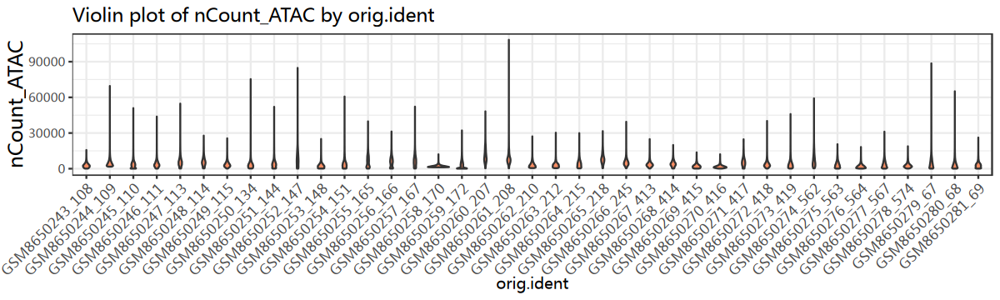

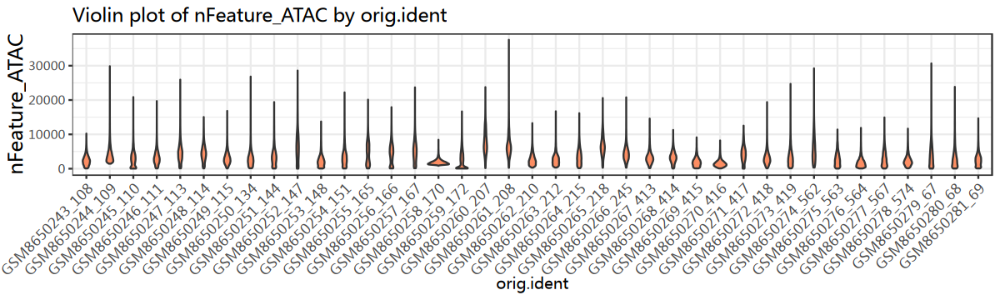

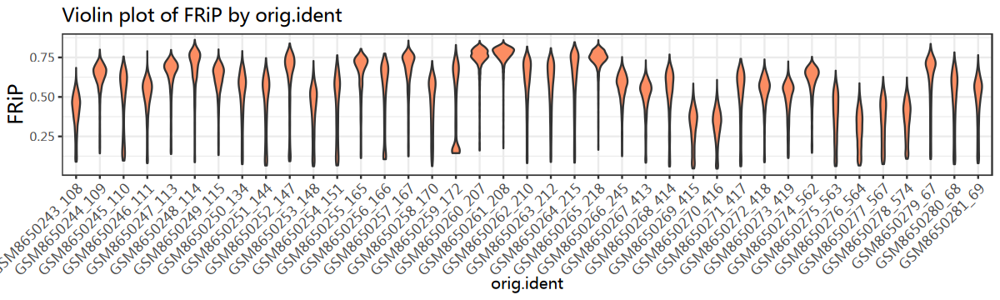

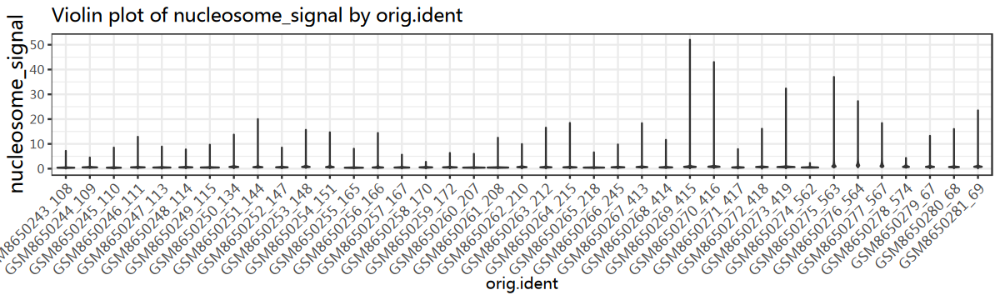

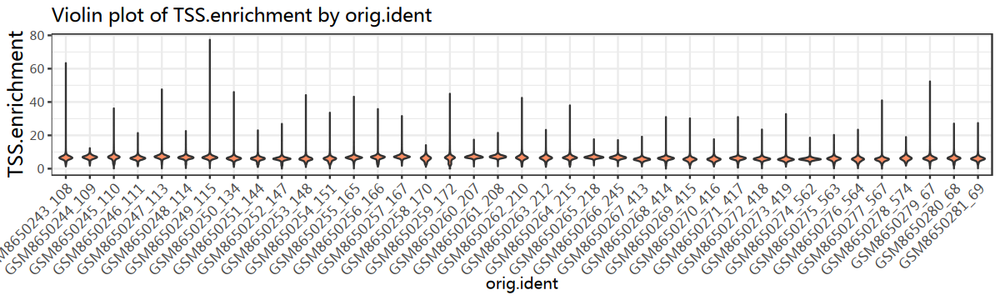

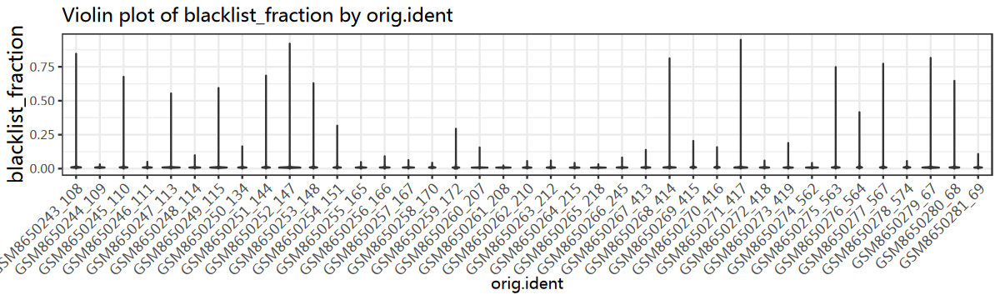

In [34]:
library(ggplot2)

options(repr.plot.width=10, repr.plot.height=3)

features <- c('nCount_ATAC', 'nFeature_ATAC', 'FRiP', 
              'nucleosome_signal', 
              'TSS.enrichment','blacklist_fraction')

for (feat in features) {
  p <- ggplot(meta_datas, aes(x = orig.ident, y = .data[[feat]])) +
    geom_violin(fill = "#fc8d62") +
    theme_bw() +
    xlab("orig.ident") +
    ylab(feat) +
    ggtitle(paste("Violin plot of", feat, "by orig.ident")) +
    theme(
      axis.text.x = element_text(angle = 45, hjust = 1, size = 10),
      axis.title.y = element_text(size = 14)
    )
  print(p)
}

In [62]:
min(meta_filt$fragments)

[1] 692

In [70]:
meta_filt

,orig.ident,nCount_ATAC,nFeature_ATAC,nucleosome_signal,nucleosome_percentile,TSS.enrichment,TSS.percentile,fragments,FRiP,blacklist_fraction,scDblFinder.class,scDblFinder.score,outlier
,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>
AAACGAAAGCCCATTA-1,GSM8650243_108,4986,4207,0.3889993,0.45,5.912065,0.29,10011,0.4980521,0.008624148,singlet,0.023005020,FALSE
AAACGAAAGTGTCGCC-1,GSM8650243_108,1598,1456,0.4472441,0.75,6.141227,0.36,4725,0.3382011,0.007509387,singlet,0.081620157,FALSE
AAACGAACAAATGTCC-1,GSM8650243_108,3545,3064,0.3354471,0.17,6.781836,0.60,9372,0.3782544,0.009873061,singlet,0.004982802,FALSE
AAACGAAGTACAACGG-1,GSM8650243_108,2901,2533,0.4211663,0.63,7.590212,0.83,5893,0.4922790,0.009651844,singlet,0.009515670,FALSE
AAACGAAGTGCAACAG-1,GSM8650243_108,4166,3649,0.3425926,0.20,6.422610,0.47,14972,0.2782527,0.005760922,singlet,0.006229762,FALSE
AAACGAATCCAACCTC-1,GSM8650243_108,1086,1013,0.4185393,0.62,6.384525,0.45,2351,0.4619311,0.012891344,singlet,0.005854310,FALSE
AAACGAATCGCAAGCC-1,GSM8650243_108,2645,2347,0.4783198,0.84,8.396731,0.94,5218,0.5068992,0.009829868,singlet,0.023023149,FALSE
AAACGAATCTCTGCGT-1,GSM8650243_108,2990,2643,0.3173432,0.11,6.566249,0.52,5807,0.5148958,0.006354515,singlet,0.259914428,FALSE
AAACTCGAGATGTTGA-1,GSM8650243_108,4075,3534,0.4169708,0.61,7.570581,0.83,6839,0.5958473,0.010552147,singlet,0.201008707,FALSE


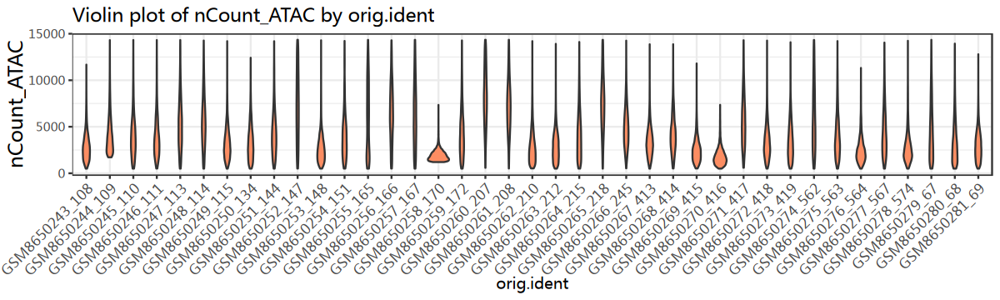

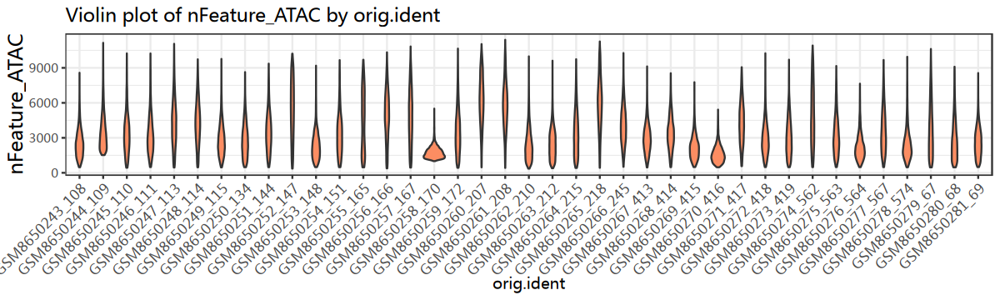

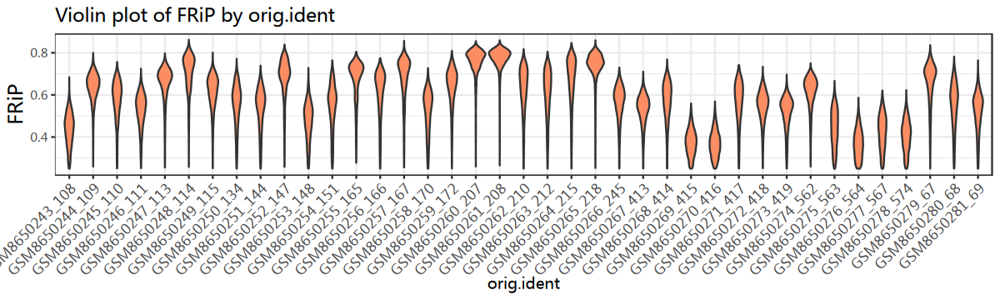

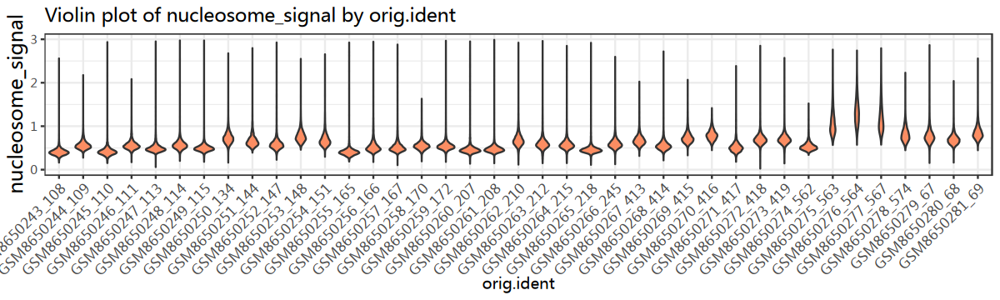

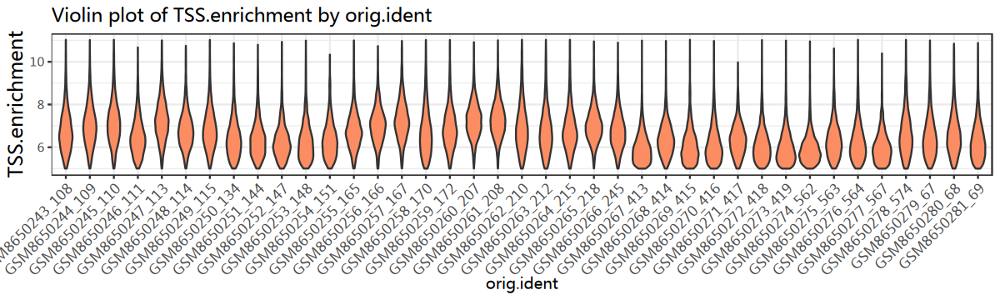

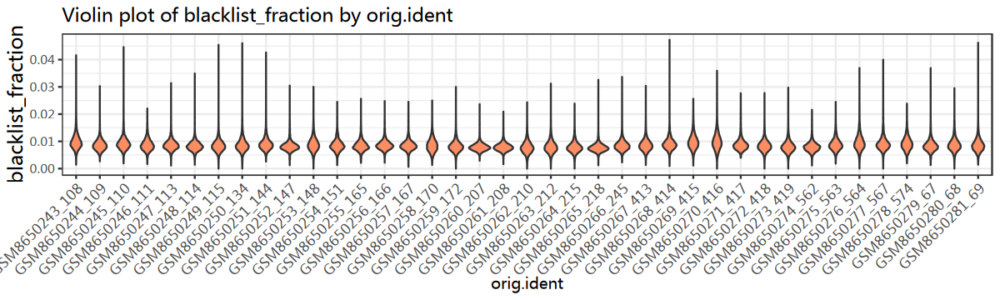

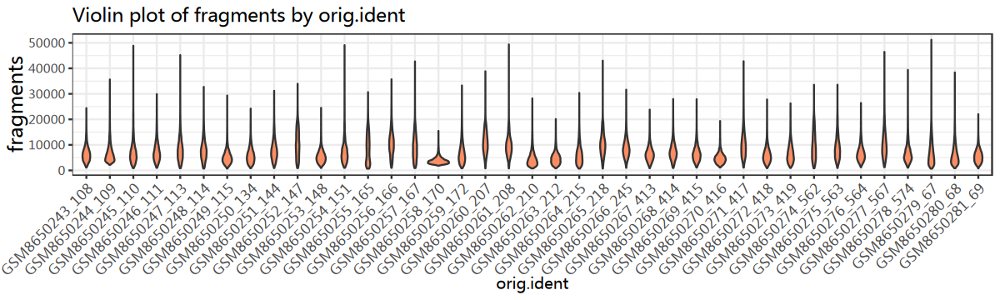

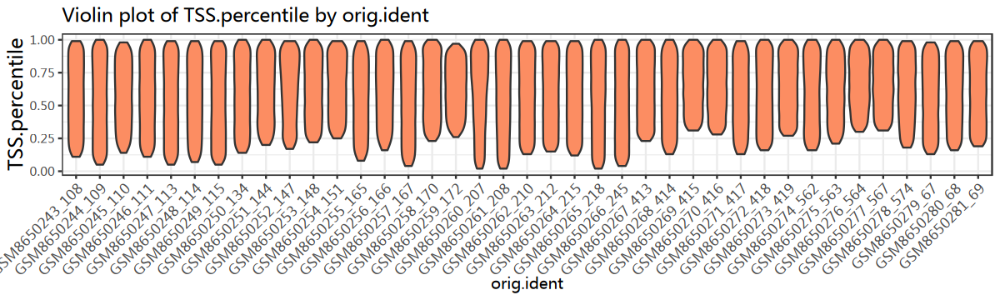

In [71]:
library(ggplot2)

options(repr.plot.width=10, repr.plot.height=3)

features <- c('nCount_ATAC', 'nFeature_ATAC', 'FRiP', 
              'nucleosome_signal', 
              'TSS.enrichment','blacklist_fraction','fragments','TSS.percentile')

for (feat in features) {
  p <- ggplot(meta_filt, aes(x = orig.ident, y = .data[[feat]])) +
    geom_violin(fill = "#fc8d62") +
    theme_bw() +
    xlab("orig.ident") +
    ylab(feat) +
    ggtitle(paste("Violin plot of", feat, "by orig.ident")) +
    theme(
      axis.text.x = element_text(angle = 45, hjust = 1, size = 10),
      axis.title.y = element_text(size = 14)
    )
  print(p)
}

In [60]:
write.csv(meta_filt, '/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/qc_meta_39sample.csv')

In [64]:
test <- readRDS("/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_rds/GSM8650255_165_atac.rds")

In [65]:
test

An object of class Seurat 
80899 features across 2311 samples within 1 assay 
Active assay: ATAC (80899 features, 0 variable features)
 2 layers present: counts, data

In [68]:
test@meta.data

,orig.ident,nCount_ATAC,nFeature_ATAC,nucleosome_signal,nucleosome_percentile,TSS.enrichment,TSS.percentile,fragments,FRiP,blacklist_fraction,scDblFinder.class,scDblFinder.score
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
AAACGAAGTTAGGCTT-1,GSM8650255_165,16064,10656,0.3894952,0.44,6.515118,0.45,21974,0.7310458,0.007843625,doublet,0.627330840
AAACGAATCATGTTCT-1,GSM8650255_165,3248,2659,0.4066986,0.55,6.665499,0.53,5038,0.6447003,0.010467980,singlet,0.008995660
AAACTCGGTCCGTAGC-1,GSM8650255_165,2190,2035,0.4259928,0.65,5.938324,0.22,4068,0.5383481,0.007762557,singlet,0.005360748
AAACTCGTCGTGGAAG-1,GSM8650255_165,13468,9033,0.4260038,0.65,5.705500,0.17,18790,0.7167642,0.006831007,singlet,0.118595853
AAACTGCAGAAATCTG-1,GSM8650255_165,243,242,0.4210526,0.63,9.590410,0.98,353,0.6883853,0.008230453,singlet,0.005921557
AAACTGCCATTTCACT-1,GSM8650255_165,7770,6125,0.3662069,0.29,6.370748,0.38,10455,0.7431851,0.009523810,singlet,0.042962767
AAACTGCGTAGACACG-1,GSM8650255_165,4146,3316,0.4605138,0.81,5.150978,0.09,8385,0.4944544,0.012059817,singlet,0.009757131
AAACTGCGTCATAGCT-1,GSM8650255_165,9154,6516,0.4182306,0.61,7.337147,0.79,12406,0.7378688,0.006554512,singlet,0.017849207
AAACTGCGTTTAGACC-1,GSM8650255_165,1695,1599,0.3750000,0.34,5.759625,0.18,2329,0.7277802,0.007669617,singlet,0.008105526


In [ ]:
# combine peak

In [45]:
meta_filt

,orig.ident,nCount_ATAC,nFeature_ATAC,nucleosome_signal,nucleosome_percentile,TSS.enrichment,TSS.percentile,fragments,FRiP,blacklist_fraction,scDblFinder.class,scDblFinder.score,outlier
,<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<dbl>,<lgl>
AAACGAAAGCCCATTA-1,GSM8650243_108,4986,4207,0.3889993,0.45,5.912065,0.29,10011,0.4980521,0.008624148,singlet,0.023005020,FALSE
AAACGAAAGTGTCGCC-1,GSM8650243_108,1598,1456,0.4472441,0.75,6.141227,0.36,4725,0.3382011,0.007509387,singlet,0.081620157,FALSE
AAACGAACAAATGTCC-1,GSM8650243_108,3545,3064,0.3354471,0.17,6.781836,0.60,9372,0.3782544,0.009873061,singlet,0.004982802,FALSE
AAACGAAGTACAACGG-1,GSM8650243_108,2901,2533,0.4211663,0.63,7.590212,0.83,5893,0.4922790,0.009651844,singlet,0.009515670,FALSE
AAACGAAGTGCAACAG-1,GSM8650243_108,4166,3649,0.3425926,0.20,6.422610,0.47,14972,0.2782527,0.005760922,singlet,0.006229762,FALSE
AAACGAATCCAACCTC-1,GSM8650243_108,1086,1013,0.4185393,0.62,6.384525,0.45,2351,0.4619311,0.012891344,singlet,0.005854310,FALSE
AAACGAATCGCAAGCC-1,GSM8650243_108,2645,2347,0.4783198,0.84,8.396731,0.94,5218,0.5068992,0.009829868,singlet,0.023023149,FALSE
AAACGAATCTCTGCGT-1,GSM8650243_108,2990,2643,0.3173432,0.11,6.566249,0.52,5807,0.5148958,0.006354515,singlet,0.259914428,FALSE
AAACTCGAGATGTTGA-1,GSM8650243_108,4075,3534,0.4169708,0.61,7.570581,0.83,6839,0.5958473,0.010552147,singlet,0.201008707,FALSE


# 在Signac中尝试

In [2]:
library(Seurat)
library(Signac)

In [91]:
test <- readRDS("/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_rds/GSM8650243_108_atac.rds")
# 如果是 Seurat 对象
test <- subset(test,
                  subset = nCount_ATAC >= 2000 & nCount_ATAC <= 25000 &
        FRiP >= 0.4 &           # 如果FRiP是百分比存的，改成 >= 25
        TSS.enrichment > 5 &
        nucleosome_signal < 3 &
        blacklist_fraction < 0.05)
atac_qc = test
atac_qc <- RunTFIDF(atac_qc)
atac_qc <- FindTopFeatures(atac_qc, min.cutoff = "q0")
atac_qc <- RunSVD(atac_qc)
atac_qc <- RunUMAP(atac_qc, reduction = "lsi", dims = 2:30)
atac_qc <- FindNeighbors(atac_qc, reduction = "lsi", dims = 2:30)
atac_qc <- FindClusters(atac_qc, resolution = 0.5)
options(repr.plot.width=4, repr.plot.height=4)
DimPlot(atac_qc)

In [108]:
# 假设你的对象名为 atac_obj
Fragments(test)

[[1]]
A Fragment object for 3205 cells


In [109]:
Fragments(test)[[1]]@path

[1] "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/fragment/GSM8650243_108.fragments.tsv.gz"

In [93]:
# 如果是 Seurat 对象
test <- subset(test,
                  subset = nCount_ATAC >= 2000 & nCount_ATAC <= 25000 &
        FRiP >= 0.4 &           # 如果FRiP是百分比存的，改成 >= 25
        TSS.enrichment > 5 &
        nucleosome_signal < 3 &
        blacklist_fraction < 0.05)


In [94]:
atac_qc = test

In [95]:
atac_qc <- RunTFIDF(atac_qc)
atac_qc <- FindTopFeatures(atac_qc, min.cutoff = "q0")
atac_qc <- RunSVD(atac_qc)
atac_qc <- RunUMAP(atac_qc, reduction = "lsi", dims = 2:30)
atac_qc <- FindNeighbors(atac_qc, reduction = "lsi", dims = 2:30)
atac_qc <- FindClusters(atac_qc, resolution = 0.6)

Performing TF-IDF normalization

Warning message in RunTFIDF.default(object = GetAssayData(object = object, layer = "counts"), :
"Some features contain 0 total counts"
Running SVD

Scaling cell embeddings

16:25:51 UMAP embedding parameters a = 0.9922 b = 1.112

16:25:52 Read 3205 rows and found 29 numeric columns

16:25:52 Using Annoy for neighbor search, n_neighbors = 30

16:25:52 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:25:52 Writing NN index file to temp file /tmp/RtmpFExgcW/file8943d6c51c2d6

16:25:52 Searching Annoy index using 1 thread, search_k = 3000

16:25:53 Annoy recall = 100%

16:25:59 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

16:26:06 Initializing from normalized Laplacian + noise (using irlba)

16:

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3205
Number of edges: 158352

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8698
Number of communities: 10
Elapsed time: 0 seconds


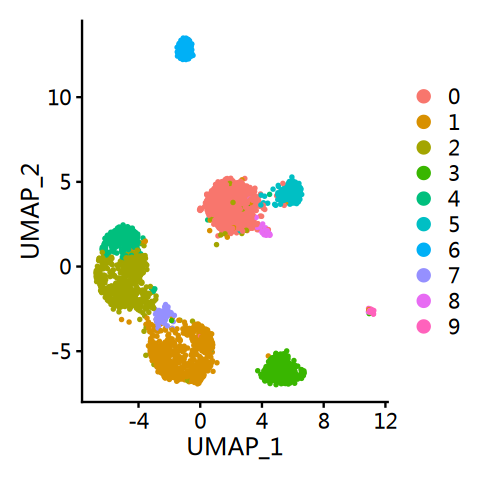

In [96]:
options(repr.plot.width=4, repr.plot.height=4)
DimPlot(atac_qc)

In [100]:
library(Signac)
library(Seurat)
library(GenomicRanges)
library(future)

plan("multicore", workers = 4)
options(future.globals.maxSize = 50000 * 1024^2) # for 50 Gb RAM


载入程辑包：'future'


The following object is masked from 'package:AnnotationFilter':

    value




In [106]:
library(GenomicRanges)

peak_dir <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/peak/"
peak_files <- list.files(peak_dir, pattern = "\\.peaks\\.bed$", recursive = TRUE, full.names = TRUE)

peak_gr_list <- lapply(peak_files, function(f) {
  df <- read.table(f, col.names = c("chr", "start", "end"))
  makeGRangesFromDataFrame(df)
})

all_peaks <- do.call("c", peak_gr_list)
combined_peaks <- GenomicRanges::reduce(all_peaks)

peakwidths <- width(combined_peaks)
combined_peaks <- combined_peaks[peakwidths < 10000 & peakwidths > 20]

bed_df <- as.data.frame(combined_peaks)[, c("seqnames", "start", "end")]
write.table(bed_df, file = "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/peak/combined_peaks.bed",
            sep = "\t", quote = FALSE, row.names = FALSE, col.names = FALSE)

In [107]:
combined_peaks

GRanges object with 259060 ranges and 0 metadata columns:
             seqnames        ranges strand
                <Rle>     <IRanges>  <Rle>
       [1]       chr1    9746-10702      *
       [2]       chr1   17049-17939      *
       [3]       chr1 180563-181900      *
       [4]       chr1 183793-184804      *
       [5]       chr1 186427-187441      *
       ...        ...           ...    ...
  [259056] KI270731.1     4503-5403      *
  [259057] KI270731.1   13428-14293      *
  [259058] KI270731.1   14793-15541      *
  [259059] KI270734.1 121034-121973      *
  [259060] KI270734.1 133424-134395      *
  -------
  seqinfo: 38 sequences from an unspecified genome; no seqlengths

In [3]:
library(Signac)
library(Seurat)
library(Matrix)
library(GenomeInfoDb)
library(EnsDb.Hsapiens.v86)

matrix_dir <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/peak"
fragment_dir <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/data/fragment"
qc_path <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/covid_qc/"
rds_path <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/output/"
combined_peak_file <- "/media/AnalysisTempDisk/Caipengfei/workspace/cxy/public/peak.bed"

# 读取统一的peak集合
combined_peaks <- rtracklayer::import(combined_peak_file)

# 注释
annotations <- GetGRangesFromEnsDb(ensdb = EnsDb.Hsapiens.v86)
seqlevelsStyle(annotations) <- "UCSC"
genome(annotations) <- "hg38"

sample_dirs <- list.dirs(matrix_dir, recursive = FALSE)
sample_names <- basename(sample_dirs)

atac_list <- list()
for (i in seq_along(sample_names)) {
  sample_name <- sample_names[i]
  data_path <- file.path(matrix_dir, sample_name)
  fragment_file <- file.path(fragment_dir, paste0(sample_name, ".fragments.tsv.gz"))
  barcodes_file <- file.path(data_path, paste0(sample_name, ".barcodes.tsv"))
  meta_file <- file.path(qc_path, paste0(sample_name, "_meta.csv"))

  cat("正在处理：", sample_name, "\n")

  # 读取meta信息
  meta_data <- read.csv(meta_file, row.names = 1)

  # 构建ChromatinAssay，使用统一peak
  cell_barcodes <- readLines(barcodes_file)
  frags <- CreateFragmentObject(path = fragment_file, cells = cell_barcodes)
  counts <- FeatureMatrix(fragments = frags, features = combined_peaks, cells = cell_barcodes)
  atac_assay <- CreateChromatinAssay(counts, fragments = frags, annotation = annotations)

  # 构建Seurat对象
  atac_obj <- CreateSeuratObject(atac_assay, assay = "ATAC", meta.data = meta_data)
  atac_obj$dataset <- sample_name
  atac_list[[i]] <- atac_obj
}

# 合并所有对象
add_ids <- sample_names
combined <- merge(
  x = atac_list[[1]],
  y = atac_list[-1],
  add.cell.ids = add_ids
)

# 保存合并后的对象
saveRDS(combined, file = file.path(rds_path, "covid_merged_redo.rds"))


载入程辑包：'Matrix'


The following objects are masked from 'package:tidyr':

    expand, pack, unpack


The following object is masked from 'package:S4Vectors':

    expand


Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)"
Warning message in .merge_two_Seqinfo_objects(x, y):
"The 2 combined objects have no sequence levels in common. (Use
  suppressWarnings() to suppress this warning.)

正在处理： GSM8650243_108 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650244_109 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650245_110 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650246_111 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650247_113 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650248_114 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650249_115 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650250_134 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650251_144 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650252_147 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650253_148 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650254_151 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650255_165 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650256_166 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650257_167 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650258_170 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650259_172 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650260_207 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650261_208 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650262_210 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650263_212 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650264_215 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650265_218 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650266_245 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650267_413 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650268_414 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650269_415 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650270_416 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650271_417 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650272_418 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650273_419 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650274_562 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650275_563 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650276_564 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650277_567 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650278_574 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650279_67 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650280_68 


Computing hash

Extracting reads overlapping genomic regions



正在处理： GSM8650281_69 


Computing hash

Extracting reads overlapping genomic regions



In [4]:
filtered <- subset(combined,
                  subset = nCount_ATAC >= 2000 & nCount_ATAC <= 25000 &
        FRiP >= 0.4 &           # 如果FRiP是百分比存的，改成 >= 25
        TSS.enrichment > 5 &
        nucleosome_signal < 3 &
        blacklist_fraction < 0.05&
        scDblFinder.class == 'singlet')

In [5]:
filtered

An object of class Seurat 
338036 features across 133744 samples within 1 assay 
Active assay: ATAC (338036 features, 0 variable features)
 2 layers present: counts, data

In [ ]:
filtered <- RunTFIDF(filtered)
filtered <- FindTopFeatures(filtered, min.cutoff = "q0.1")
filtered <- RunSVD(filtered)
filtered <- RunUMAP(filtered, reduction = "lsi", dims = 2:30)
filtered <- FindNeighbors(filtered, reduction = "lsi", dims = 2:30)
filtered <- FindClusters(filtered, resolution = 0.6)

Performing TF-IDF normalization

Warning message in RunTFIDF.default(object = GetAssayData(object = object, layer = "counts"), :
"Some features contain 0 total counts"
Running SVD

Scaling cell embeddings

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
22:04:38 UMAP embedding parameters a = 0.9922 b = 1.112

22:04:39 Read 133744 rows and found 29 numeric columns

22:04:39 Using Annoy for neighbor search, n_neighbors = 30

22:04:39 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

22:04:56 Writing NN index file to temp file /tmp/RtmpVOlj

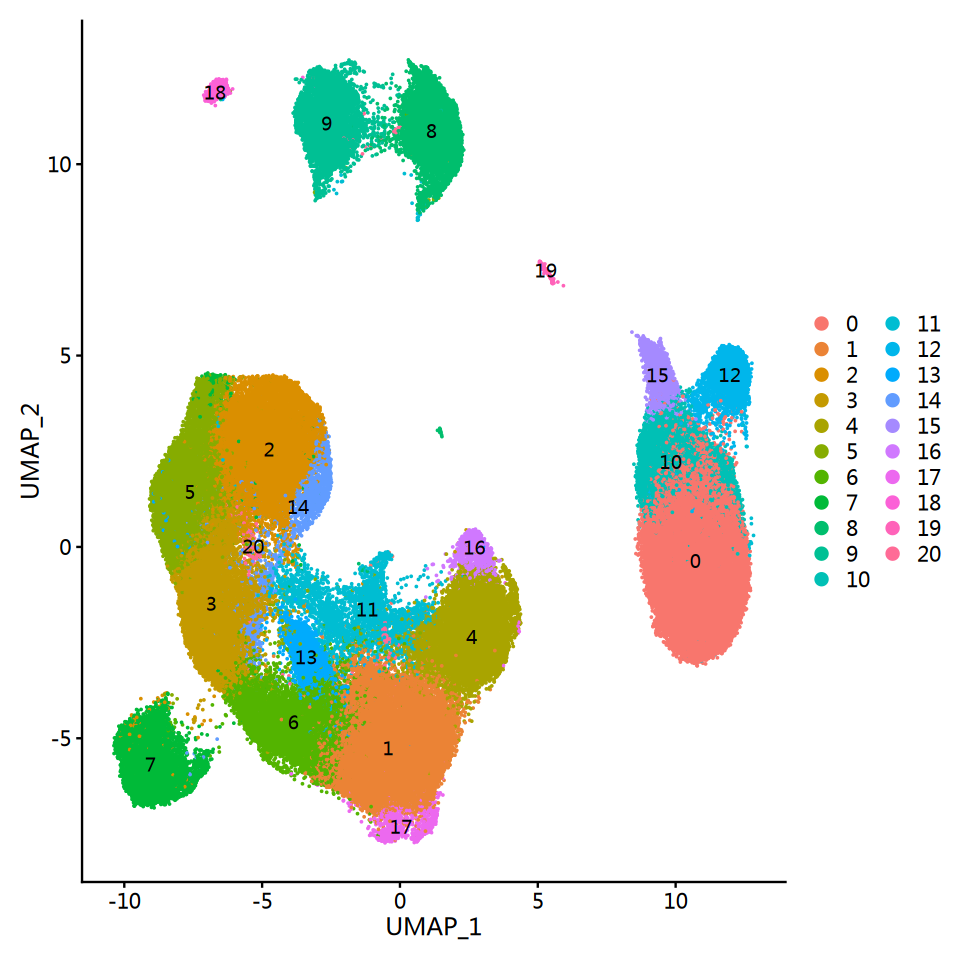

In [22]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(filtered,raster=FALSE,label=TRUE)

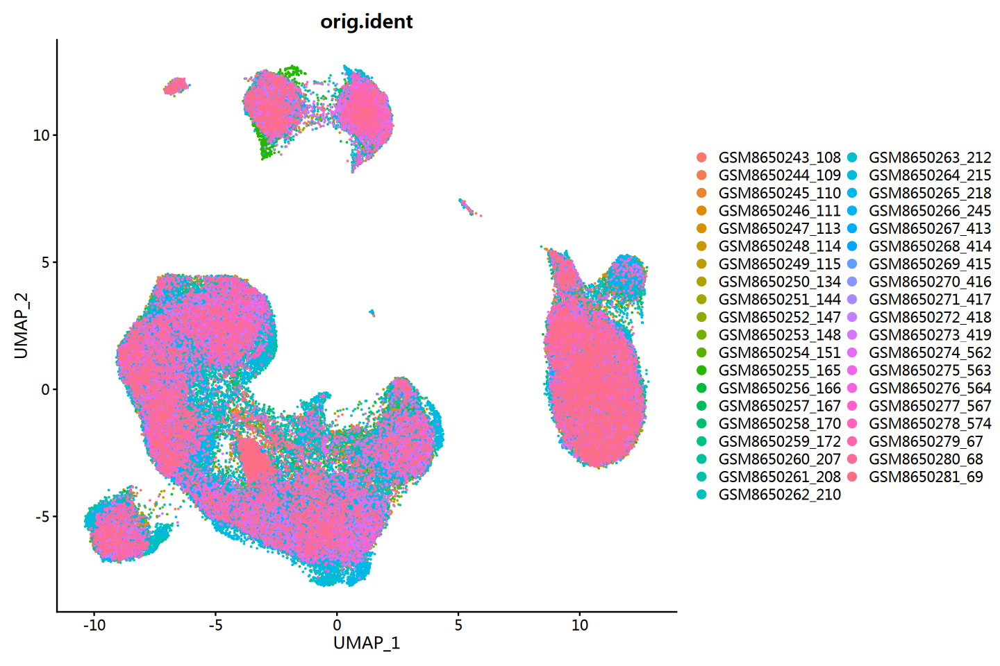

In [20]:
options(repr.plot.width=12, repr.plot.height=8)
DimPlot(filtered,group.by ='orig.ident',raster=FALSE)

In [ ]:
saveRDS(filtered,"../output/filtered_redo.rds")

In [19]:
filtered <- readRDS("../output/filtered_redo.rds")

In [20]:
filtered

An object of class Seurat 
338036 features across 133744 samples within 1 assay 
Active assay: ATAC (338036 features, 338036 variable features)
 2 layers present: counts, data
 2 dimensional reductions calculated: lsi, umap

In [21]:
counts <- GetAssayData(filtered, slot = "counts")
nonzero_features <- rowSums(counts) > 0
filtered <- subset(filtered, features = rownames(counts)[nonzero_features])

In [22]:
filtered

An object of class Seurat 
338003 features across 133744 samples within 1 assay 
Active assay: ATAC (338003 features, 338003 variable features)
 2 layers present: counts, data
 2 dimensional reductions calculated: lsi, umap

In [23]:
filtered@reductions <- list()

In [24]:
filtered

An object of class Seurat 
338003 features across 133744 samples within 1 assay 
Active assay: ATAC (338003 features, 338003 variable features)
 2 layers present: counts, data

In [27]:
filtered <- RunTFIDF(filtered)
filtered <- FindTopFeatures(filtered, min.cutoff = "q75")
filtered <- RunSVD(filtered)
filtered <- RunUMAP(filtered, reduction = "lsi", dims = 2:30)
filtered <- FindNeighbors(filtered, reduction = "lsi", dims = 2:30)
filtered <- FindClusters(filtered, resolution = 0.6)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

16:40:43 UMAP embedding parameters a = 0.9922 b = 1.112

16:40:43 Read 133744 rows and found 29 numeric columns

16:40:43 Using Annoy for neighbor search, n_neighbors = 30

16:40:43 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:40:58 Writing NN index file to temp file /tmp/Rtmp23CGex/file568a67a6a3d8a

16:40:58 Searching Annoy index using 1 thread, search_k = 3000

16:41:55 Annoy recall = 100%

16:41:58 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

16:42:04 Initializing from normalized Laplacian + noise (using irlba)

16:42:50 Commencing optimization for 200 epochs, with 5678588 positive edges

16:44:15 Optimization finished

Computing nearest neighbor

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 133744
Number of edges: 4223870

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9410
Number of communities: 34
Elapsed time: 62 seconds


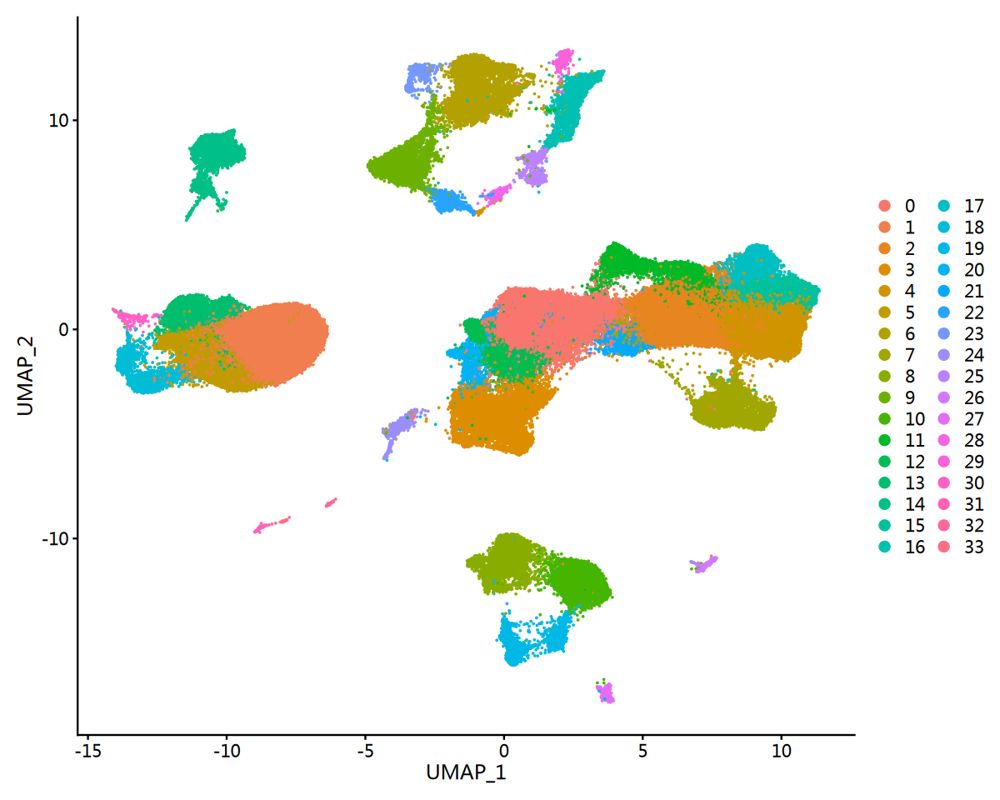

In [28]:
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(filtered,raster=FALSE)

In [29]:
library(Seurat)
library(Signac)
library(harmony)

In [30]:
filtered <- harmony::RunHarmony(object = filtered,
    group.by.vars = "orig.ident",
    reduction.use = 'lsi', assay.use = 'ATAC',
    project.dim = FALSE, dims.use = 2:30,
    max.iter.harmony = 50)

Transposing data matrix

Initializing state using k-means centroids initialization

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6687200)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony converged after 5 iterations



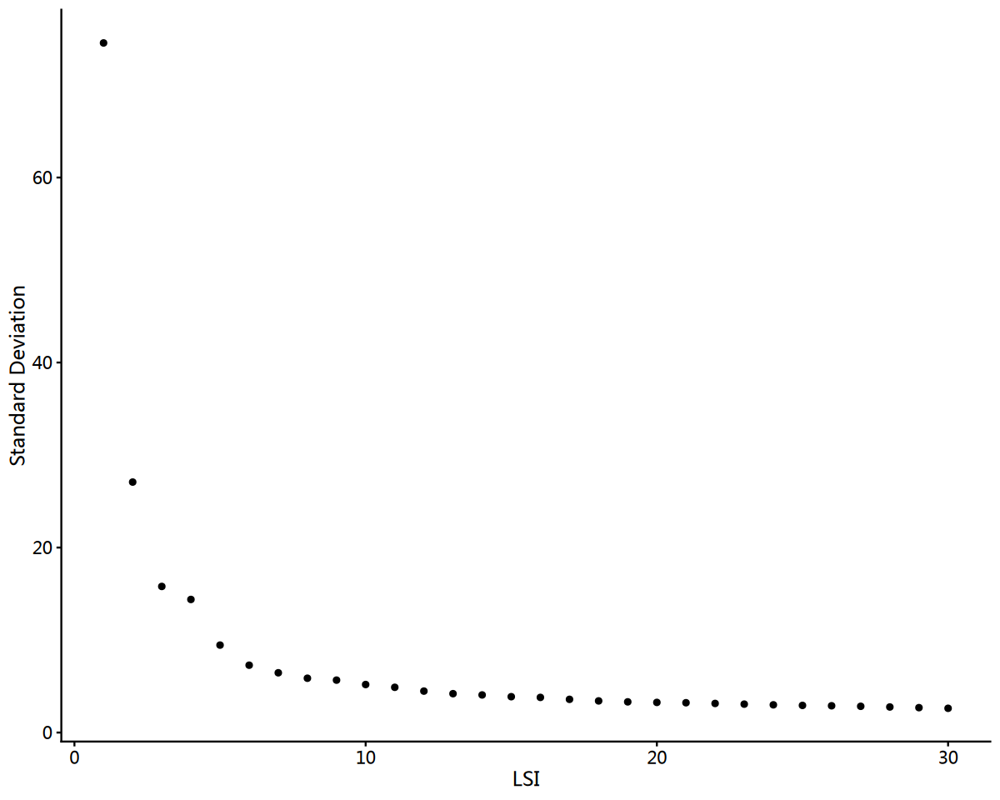

In [31]:
ElbowPlot(object = filtered,reduction ='lsi',ndims=30)

In [32]:
# 用Harmony结果做邻居和UMAP
filtered <- FindNeighbors(filtered, reduction = "harmony", dims = 1:20)
filtered <- RunUMAP(filtered, reduction = "harmony", dims = 1:20)
filtered <- FindClusters(filtered, resolution = 0.6)

Computing nearest neighbor graph

Computing SNN

16:49:12 UMAP embedding parameters a = 0.9922 b = 1.112

16:49:12 Read 133744 rows and found 20 numeric columns

16:49:12 Using Annoy for neighbor search, n_neighbors = 30

16:49:12 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:49:25 Writing NN index file to temp file /tmp/Rtmp23CGex/file568a65609de10

16:49:25 Searching Annoy index using 1 thread, search_k = 3000

16:50:26 Annoy recall = 100%

16:50:28 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

16:50:34 Initializing from normalized Laplacian + noise (using irlba)

16:51:00 Commencing optimization for 200 epochs, with 5664092 positive edges

16:52:21 Optimization finished



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 133744
Number of edges: 3606226

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9113
Number of communities: 21
Elapsed time: 52 seconds


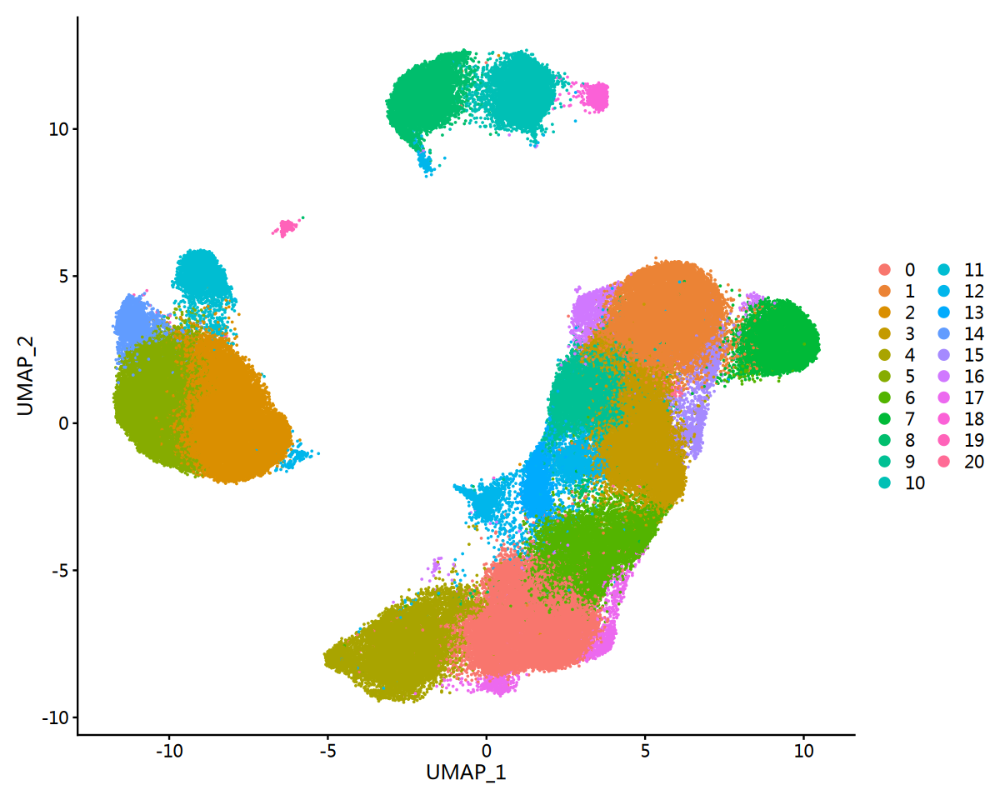

In [33]:
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(filtered,raster=FALSE)

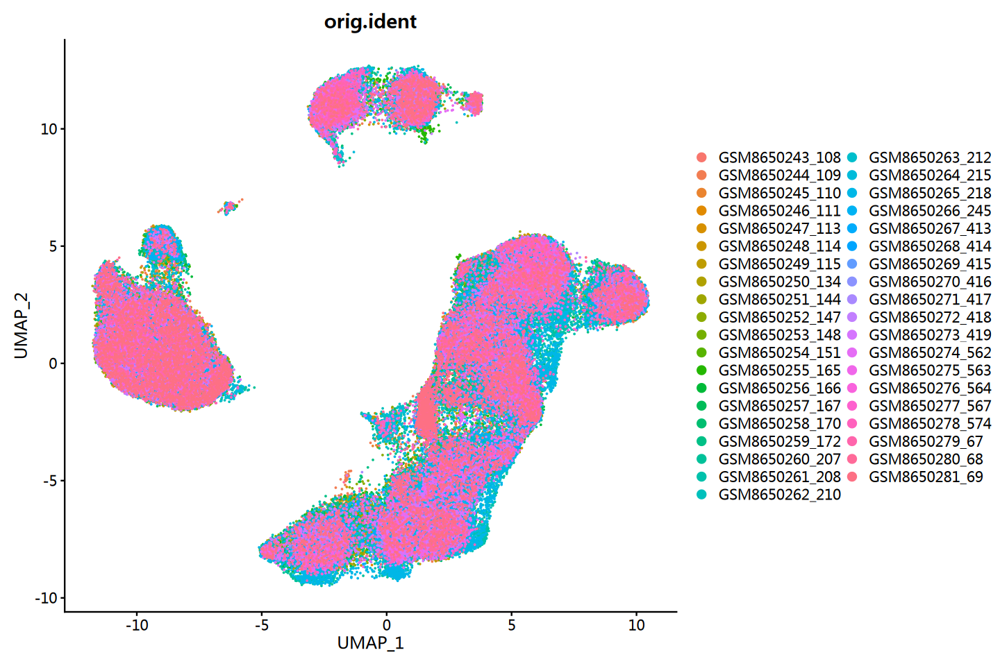

In [34]:
options(repr.plot.width=12, repr.plot.height=8)
DimPlot(filtered,group.by ='orig.ident',raster=FALSE)

In [35]:
filtered@reductions

$lsi
A dimensional reduction object with key LSI_ 
 Number of dimensions: 50 
 Number of cells: 133744 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: ATAC 

$umap
A dimensional reduction object with key UMAP_ 
 Number of dimensions: 2 
 Number of cells: 133744 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: ATAC 

$harmony
A dimensional reduction object with key harmony_ 
 Number of dimensions: 29 
 Number of cells: 133744 
 Projected dimensional reduction calculated:  FALSE 
 Jackstraw run: FALSE 
 Computed using assay: ATAC 


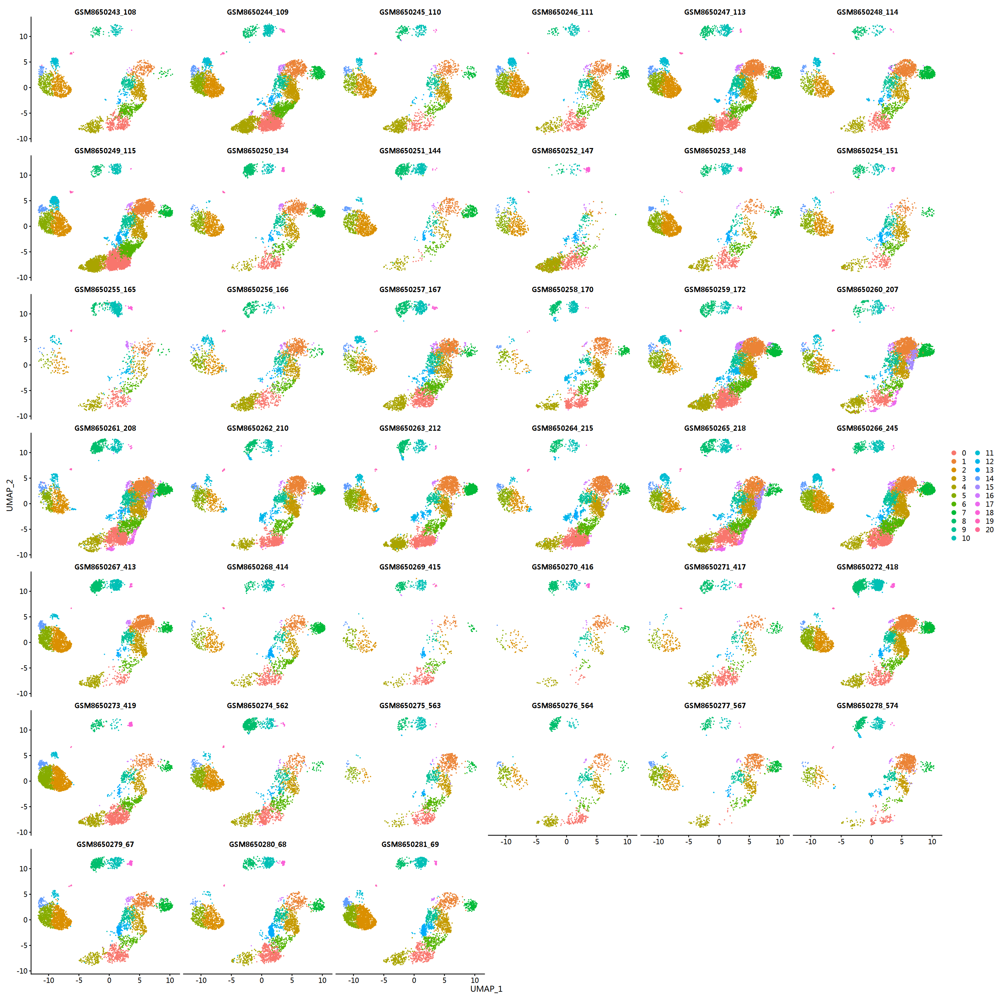

In [36]:
options(repr.plot.width=25, repr.plot.height=25)
DimPlot(filtered,raster=FALSE, split.by = 'orig.ident',ncol = 6)

In [38]:
saveRDS(filtered,"../output/filtered_redo_harmony.rds")

In [179]:
gene.activities <- GeneActivity(filtered)

Extracting gene coordinates

Warning message in SingleFeatureMatrix(fragment = fragments[[x]], features = features, :
"13 features are on seqnames not present in the fragment file. These will be removed."
Extracting reads overlapping genomic regions

Warning message in SingleFeatureMatrix(fragment = fragments[[x]], features = features, :
"13 features are on seqnames not present in the fragment file. These will be removed."
Extracting reads overlapping genomic regions

Warning message in SingleFeatureMatrix(fragment = fragments[[x]], features = features, :
"13 features are on seqnames not present in the fragment file. These will be removed."
Extracting reads overlapping genomic regions

Warning message in SingleFeatureMatrix(fragment = fragments[[x]], features = features, :
"13 features are on seqnames not present in the fragment file. These will be removed."
Extracting reads overlapping genomic regions

Warning message in SingleFeatureMatrix(fragment = fragments[[x]], features = featur

In [181]:
options(future.globals.maxSize = 100 * 1024^3) # 允许最大100GB

In [182]:
# add the gene activity matrix to the Seurat object as a new assay and normalize it
filtered[['RNA']] <- CreateAssayObject(counts = gene.activities)
filtered <- NormalizeData(
  object = filtered,
  assay = 'RNA',
  normalization.method = 'LogNormalize',
  scale.factor = median(filtered$nCount_RNA)
)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



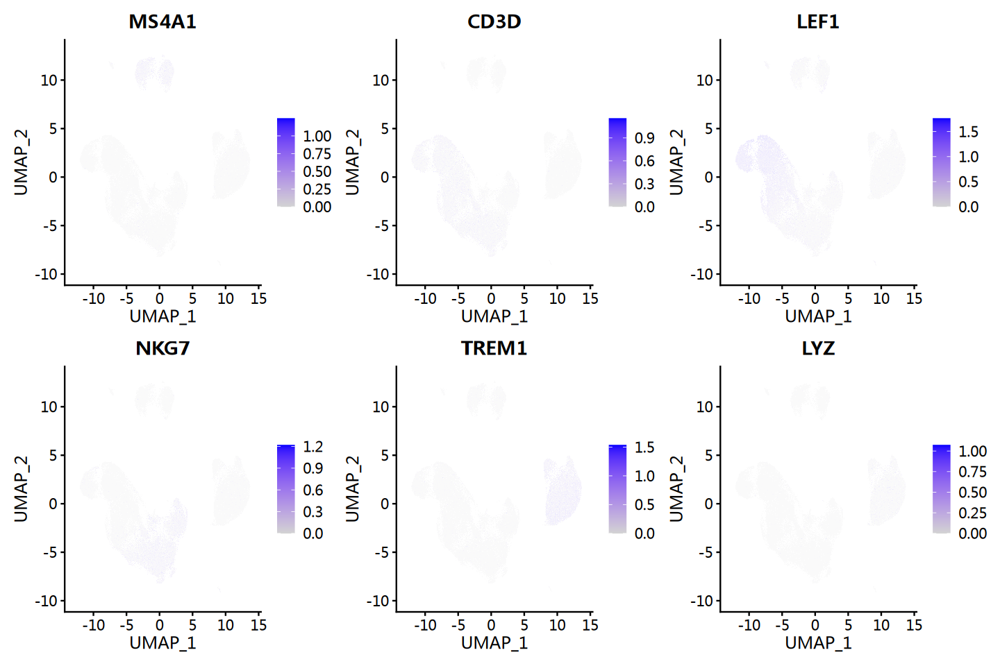

In [183]:
DefaultAssay(filtered) <- 'RNA'

FeaturePlot(
  object = filtered,
  features = c('MS4A1', 'CD3D', 'LEF1', 'NKG7', 'TREM1', 'LYZ'),
  pt.size = 0.1,
  max.cutoff = 'q95',
  ncol = 3
)

In [184]:
filtered

An object of class Seurat 
278680 features across 133744 samples within 2 assays 
Active assay: RNA (19620 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: ATAC
 3 dimensional reductions calculated: lsi, umap, harmony

In [186]:
DefaultAssay(filtered) <- 'ATAC'

In [189]:
head(rownames(filtered))

[1] "chr1-9747-10702"    "chr1-17050-17939"   "chr1-180564-181900"
[4] "chr1-183794-184804" "chr1-186428-187441" "chr1-190948-192101"

In [37]:
filtered

An object of class Seurat 
338003 features across 133744 samples within 1 assay 
Active assay: ATAC (338003 features, 84527 variable features)
 2 layers present: counts, data
 3 dimensional reductions calculated: lsi, umap, harmony

# Reference mapping|

In [104]:
pbmc.multi <- readRDS("/media/AnalysisTempDisk/Caipengfei/workspace/cxy/data/renamed_cima_Sampling5kperl3_156746cells.rds")

In [1]:
pbmc.multi <- readRDS("/media/AnalysisTempDisk/Caipengfei/workspace/cxy/data/renamed_subset_3samples.rds")

In [2]:
pbmc.multi

载入需要的程辑包：SeuratObject

载入需要的程辑包：sp


载入程辑包：‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t




An object of class Seurat 
338036 features across 23276 samples within 1 assay 
Active assay: RNA (338036 features, 0 variable features)
 2 layers present: counts, data

In [5]:
pbmc.multi@reductions

list()

In [3]:
# 去除总表达为0的feature
counts <- GetAssayData(pbmc.multi, slot = "counts")
nonzero_features <- rowSums(counts) > 0
pbmc.multi <- subset(pbmc.multi, features = rownames(counts)[nonzero_features])

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


In [4]:
# 复制 assay对象并重命名
pbmc.multi[["ATAC"]] <- pbmc.multi[["RNA"]]

Warning message:
“Key ‘rna_’ taken, using ‘atac_’ instead”


ERROR: Error: Cannot delete default assay


In [5]:
pbmc.multi

An object of class Seurat 
648226 features across 23276 samples within 2 assays 
Active assay: RNA (324113 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: ATAC

In [6]:
DefaultAssay(pbmc.multi) <- "ATAC"

In [7]:
pbmc.multi[["RNA"]] <- NULL

In [8]:
pbmc.multi

An object of class Seurat 
324113 features across 23276 samples within 1 assay 
Active assay: ATAC (324113 features, 0 variable features)
 2 layers present: counts, data

In [11]:
pbmc.multi <- RunTFIDF(pbmc.multi)
pbmc.multi <- FindTopFeatures(pbmc.multi, min.cutoff = "q75")
pbmc.multi <- RunSVD(pbmc.multi)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings



In [12]:
pbmc.multi <- RunUMAP(pbmc.multi, reduction = "lsi", dims = 2:30)
pbmc.multi <- FindNeighbors(pbmc.multi, reduction = "lsi", dims = 2:30)
pbmc.multi <- FindClusters(pbmc.multi, resolution = 0.6)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
16:16:06 UMAP embedding parameters a = 0.9922 b = 1.112

16:16:06 Read 23276 rows and found 29 numeric columns

16:16:06 Using Annoy for neighbor search, n_neighbors = 30

16:16:06 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:16:09 Writing NN index file to temp file /tmp/Rtmp23CGex/file568a633a123e3

16:16:09 Searching Annoy index using 1 thread, search_k = 3000

16:16:16 Annoy recall = 100%

16:16:17 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 23276
Number of edges: 807790

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9335
Number of communities: 22
Elapsed time: 4 seconds


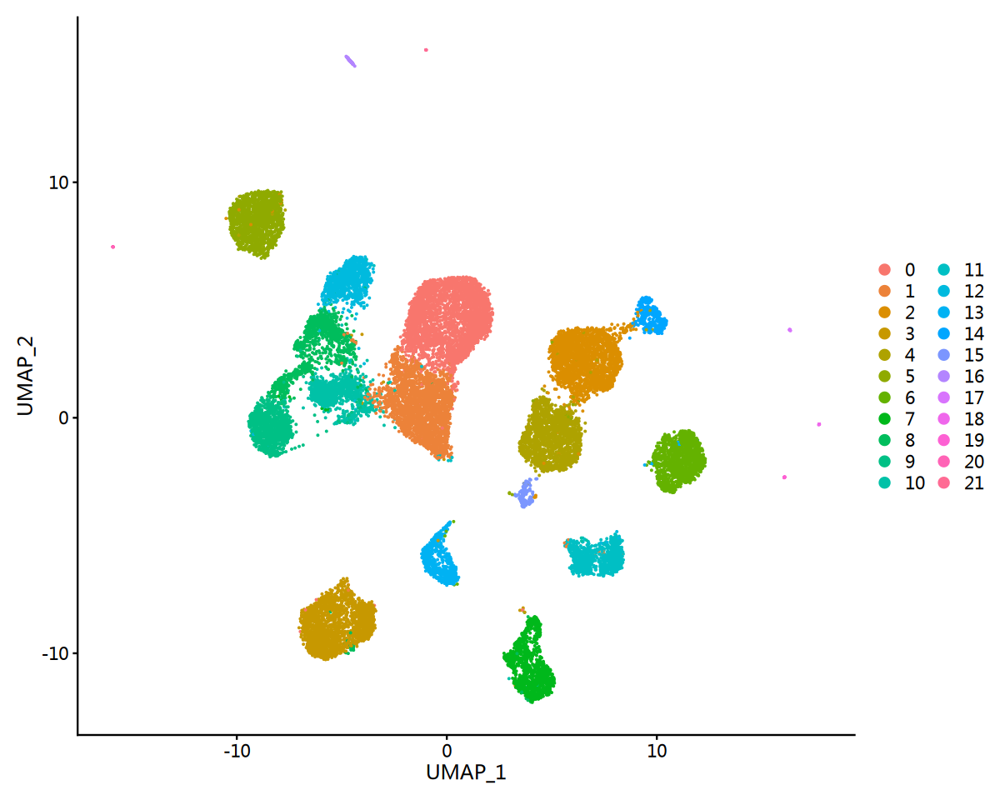

In [201]:
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(pbmc.multi,raster=FALSE)

In [ ]:
options(repr.plot.width=12, repr.plot.height=8)
DimPlot(pbmc.multi,group.by ='sample',raster=FALSE)

In [ ]:
#per5k <- pbmc.multi

In [13]:
pbmc.multi <- harmony::RunHarmony(object = pbmc.multi,
    group.by.vars = "sample",
    reduction.use = 'lsi', assay.use = 'ATAC',
    project.dim = FALSE, dims.use = 2:30,
    max.iter.harmony = 50)

Warning message:
“Warning: The parameter max.iter.harmony is replaced with parameter max_iter. It will be ignored for this function call and please use parameter max_iter in future function calls.
This warning is displayed once per session.”
Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony converged after 6 iterations



In [14]:
pbmc.multi <- RunUMAP(pbmc.multi, reduction = "lsi", dims = 1:20)
pbmc.multi <- FindNeighbors(pbmc.multi, reduction = "lsi", dims = 1:20)
pbmc.multi <- FindClusters(pbmc.multi, resolution = 0.6)

16:16:55 UMAP embedding parameters a = 0.9922 b = 1.112

16:16:55 Read 23276 rows and found 20 numeric columns

16:16:55 Using Annoy for neighbor search, n_neighbors = 30

16:16:55 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:16:57 Writing NN index file to temp file /tmp/Rtmp23CGex/file568a62d02bc63

16:16:57 Searching Annoy index using 1 thread, search_k = 3000

16:17:05 Annoy recall = 100%

16:17:06 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

16:17:07 Found 5 connected components, 
falling back to 'spca' initialization with init_sdev = 1

16:17:07 Using 'irlba' for PCA

16:17:08 PCA: 2 components explained 13.43% variance

16:17:08 Scaling init to sdev = 1

16:17:08 Commencing optimization for 200 epochs, with 923448

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 23276
Number of edges: 759760

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9120
Number of communities: 19
Elapsed time: 4 seconds


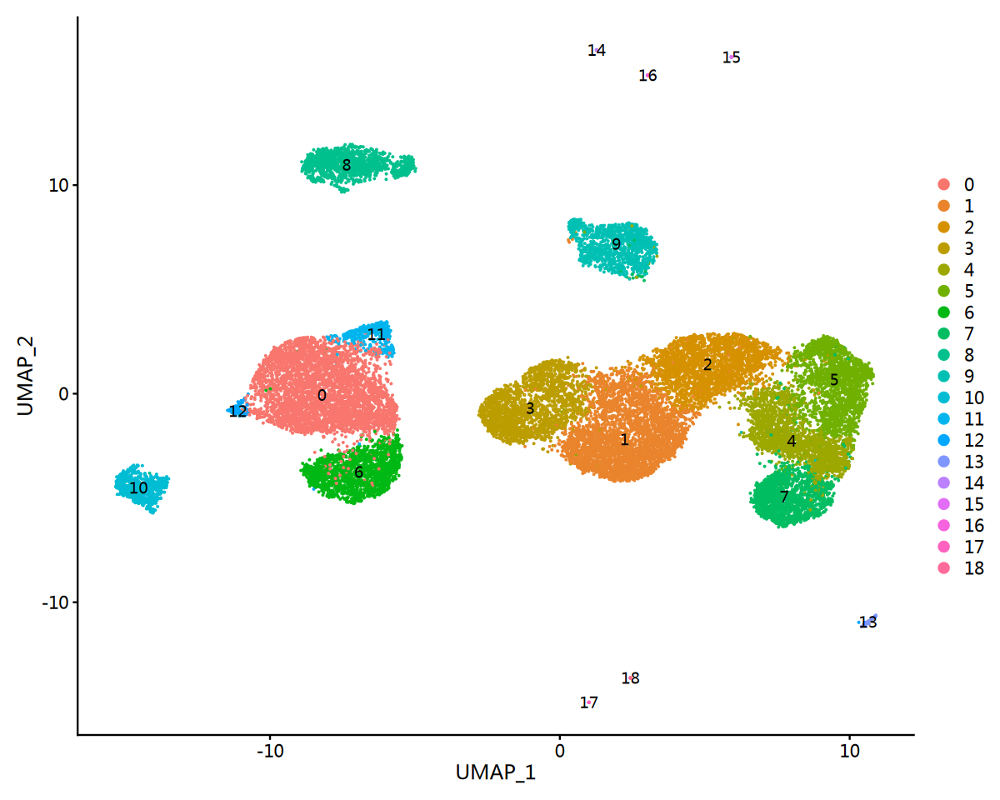

In [15]:
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(pbmc.multi,raster=FALSE,label=TRUE)

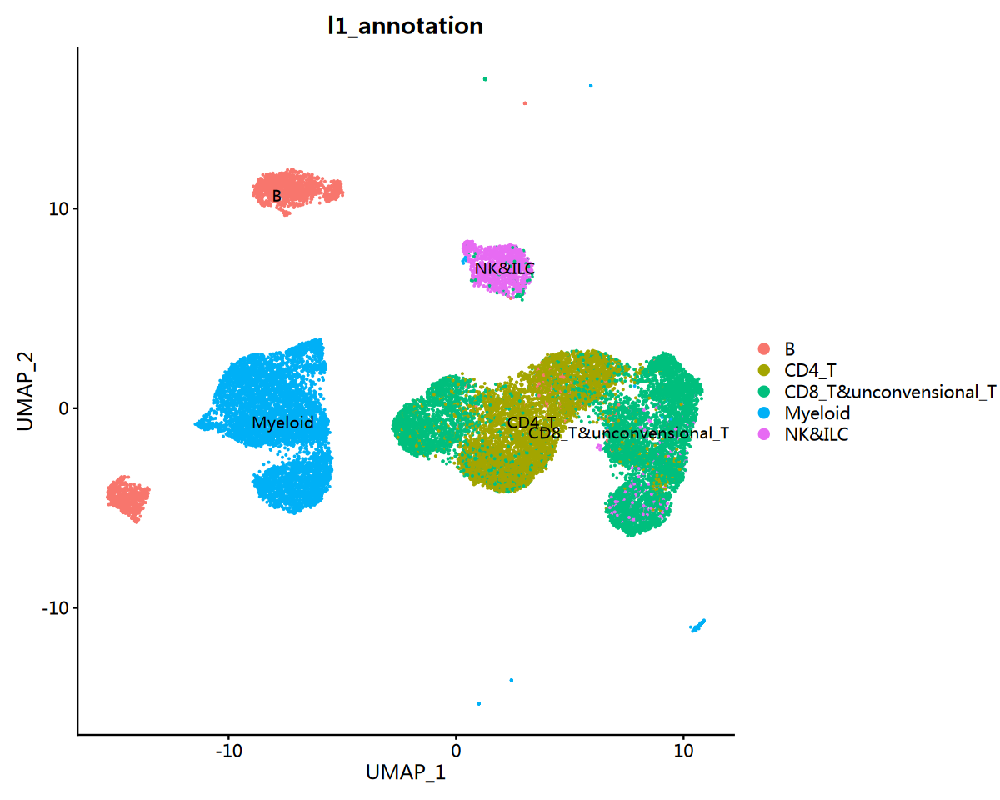

In [16]:
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(pbmc.multi,raster=FALSE, group.by = 'l1_annotation',label=TRUE)

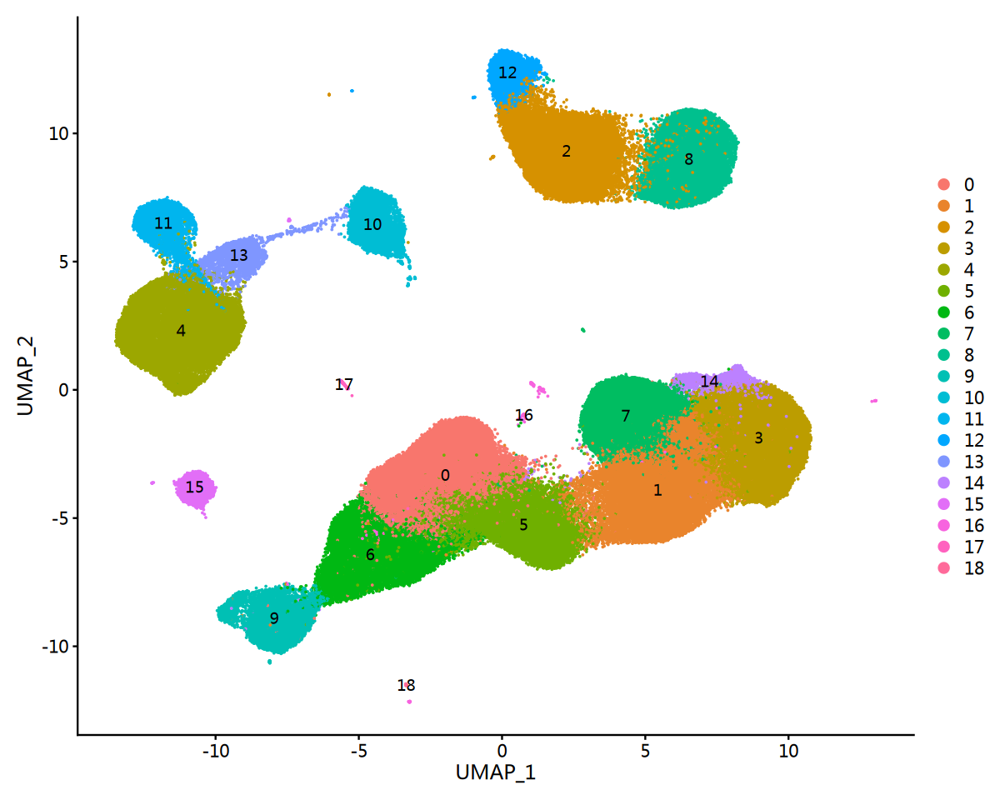

In [166]:
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(pbmc.multi,raster=FALSE,label=TRUE)

In [167]:
options(repr.plot.width=10, repr.plot.height=5)
DimPlot(pbmc.multi,raster=FALSE, split.by = 'sample',ncol = 3)

In [168]:
pbmc.multi@meta.data

,sample,barcode,final_annotation,orig.ident,l3_annotation,l2_annotation,l1_annotation,nCount_RNA,nFeature_RNA,RNA_snn_res.0.6,seurat_clusters
,<fct>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>,<int>,<fct>,<fct>
20230307-ATAC-E-B21202409408-a-2_BC06588_N01,E-B21202409408,20230307-ATAC-E-B21202409408-a-2_BC06588_N01,Atypical_Bm_ITGAX,20230307-ATAC-E-B21202409408-a-2,Atypical_Bm,Memory_B,B,5508,2541,12,12
20230109-ATAC-E-B21672487751-a-2_BC00990_N01,E-B21672487751,20230109-ATAC-E-B21672487751-a-2_BC00990_N01,Atypical_Bm_ITGAX,20230109-ATAC-E-B21672487751-a-2,Atypical_Bm,Memory_B,B,8511,3644,12,12
20230315-ATAC-E-B21506552439-b-2_BC00118_N02,E-B21506552439,20230315-ATAC-E-B21506552439-b-2_BC00118_N02,Atypical_Bm_ITGAX,20230315-ATAC-E-B21506552439-b-2,Atypical_Bm,Memory_B,B,22470,8782,12,12
20230112-ATAC-E-B21733167679-a-1_BC00714_N02,E-B21733167679,20230112-ATAC-E-B21733167679-a-1_BC00714_N02,Atypical_Bm_ITGAX,20230112-ATAC-E-B21733167679-a-1,Atypical_Bm,Memory_B,B,16644,6477,12,12
20230202-ATAC-E-B21155258684-C-1_BC02250_N02,E-B21155258684,20230202-ATAC-E-B21155258684-C-1_BC02250_N02,Atypical_Bm_ITGAX,20230202-ATAC-E-B21155258684-C-1,Atypical_Bm,Memory_B,B,9115,3967,12,12
20230315-ATAC-E-B21480960495-b-1_BC01883_N03,E-B21480960495,20230315-ATAC-E-B21480960495-b-1_BC01883_N03,Atypical_Bm_ITGAX,20230315-ATAC-E-B21480960495-b-1,Atypical_Bm,Memory_B,B,10853,4472,12,12
20230222-ATAC-E-B21253625595-b-1_BC10471_N01,E-B21253625595,20230222-ATAC-E-B21253625595-b-1_BC10471_N01,Atypical_Bm_ITGAX,20230222-ATAC-E-B21253625595-b-1,Atypical_Bm,Memory_B,B,5691,2630,8,8
20221117-ATAC-E-B21420243475-a-1_BC00658_N02,E-B21420243475,20221117-ATAC-E-B21420243475-a-1_BC00658_N02,Atypical_Bm_ITGAX,20221117-ATAC-E-B21420243475-a-1,Atypical_Bm,Memory_B,B,17539,6170,12,12
20230202-ATAC-E-B21433880158-B-1_BC06861_N01,E-B21433880158,20230202-ATAC-E-B21433880158-B-1_BC06861_N01,Atypical_Bm_ITGAX,20230202-ATAC-E-B21433880158-B-1,Atypical_Bm,Memory_B,B,4303,2049,8,8


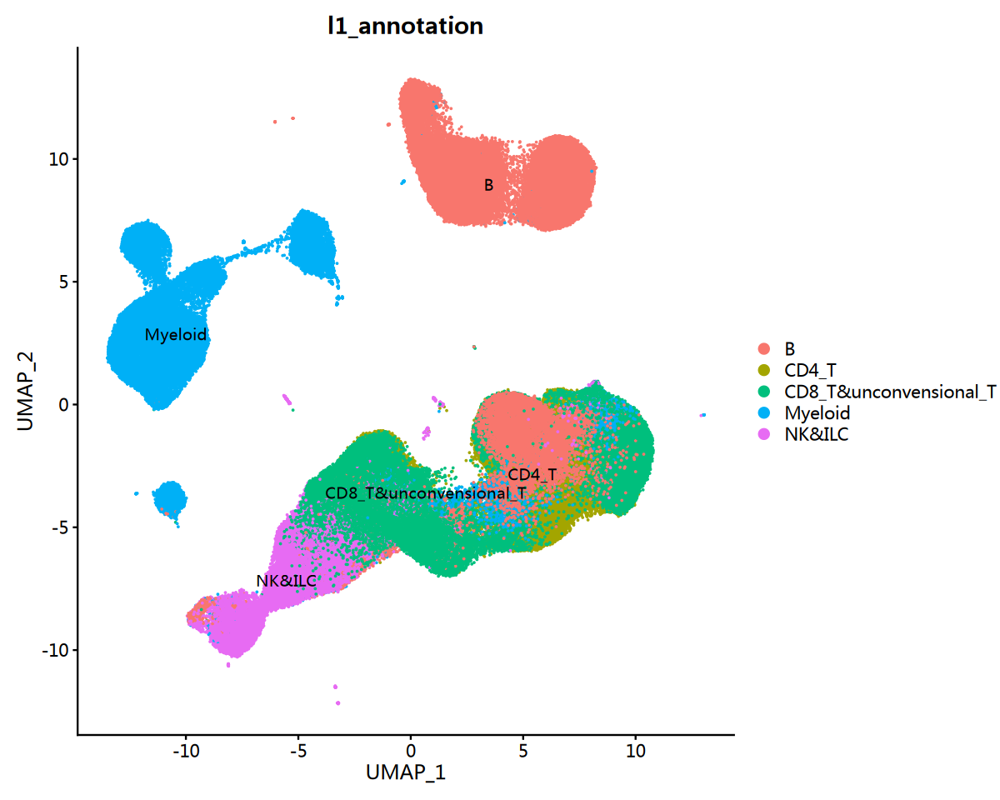

In [169]:
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(pbmc.multi,raster=FALSE, group.by = 'l1_annotation',label=TRUE)

In [17]:
pbmc.multi

An object of class Seurat 
324113 features across 23276 samples within 1 assay 
Active assay: ATAC (324113 features, 81218 variable features)
 2 layers present: counts, data
 3 dimensional reductions calculated: lsi, umap, harmony

In [18]:
saveRDS(pbmc.multi,"../output/cima_harmony.rds")

In [173]:
filtered

An object of class Seurat 
338036 features across 133744 samples within 1 assay 
Active assay: ATAC (338036 features, 338036 variable features)
 2 layers present: counts, data
 3 dimensional reductions calculated: lsi, umap, harmony

In [42]:
# 获取 pbmc.multi 的高变特征
hvg <- VariableFeatures(pbmc.multi)

# 与 filtered 的行名取交集
intersect_features <- intersect(hvg, rownames(filtered))
length(intersect_features)

[1] 81216

In [41]:
intersect_features <- intersect(rownames(pbmc.multi), rownames(filtered))
length(intersect_features) # 应该大于0

[1] 324082

In [43]:
peaks.use <- sample(intersect_features, size = 5000, replace = FALSE)

In [44]:
length(peaks.use)

[1] 5000

In [45]:
# compute UMAP and store the UMAP model
pbmc.multi <- RunUMAP(pbmc.multi, reduction = "lsi", dims = 1:20, return.model = TRUE)

UMAP will return its model

17:09:01 UMAP embedding parameters a = 0.9922 b = 1.112

17:09:01 Read 23276 rows and found 20 numeric columns

17:09:01 Using Annoy for neighbor search, n_neighbors = 30

17:09:01 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:09:03 Writing NN index file to temp file /tmp/Rtmp23CGex/file568a67d1a8909

17:09:03 Searching Annoy index using 1 thread, search_k = 3000

17:09:10 Annoy recall = 100%

17:09:11 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

17:09:13 Found 5 connected components, 
falling back to 'spca' initialization with init_sdev = 1

17:09:13 Using 'irlba' for PCA

17:09:13 PCA: 2 components explained 13.43% variance

17:09:13 Scaling init to sdev = 1

17:09:13 Commencing optimization

In [48]:
filtered

An object of class Seurat 
338003 features across 133744 samples within 1 assay 
Active assay: ATAC (338003 features, 84527 variable features)
 2 layers present: counts, data
 3 dimensional reductions calculated: lsi, umap, harmony

In [53]:
filtered

An object of class Seurat 
338003 features across 133744 samples within 1 assay 
Active assay: ATAC (338003 features, 84527 variable features)
 2 layers present: counts, data
 3 dimensional reductions calculated: lsi, umap, harmony

In [49]:
# find transfer anchors
transfer.anchors <- FindTransferAnchors(
  reference = pbmc.multi,
  query = filtered,
  reference.reduction = "lsi",
  reduction = "lsiproject",
  dims = 1:20,
  features = peaks.use
)

Projecting new data onto SVD

Finding neighborhoods

Finding anchors

	Found 22821 anchors



In [50]:
transfer.anchors

An AnchorSet object containing 22821 anchors between the reference and query Seurat objects. 
 This can be used as input to TransferData.

In [55]:
# map query onto the reference dataset
pbmc.atac <- MapQuery(
  anchorset = transfer.anchors,
  reference = pbmc.multi,
  query = filtered,
  refdata = pbmc.multi$l1_annotation,
  reference.reduction = "lsi",
  new.reduction.name = "ref.lsi",
  reduction.model = 'umap'
)

Warning message:
“`invoke()` is deprecated as of rlang 0.4.0.
Please use `exec()` or `inject()` instead.
This warning is displayed once every 8 hours.”
Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Layer counts isn't present in the assay object; returning NULL”
Warning message:
“Layer counts isn't present in the assay object; returning NULL”
Warning message:
“Layer counts isn't present in the assay object; returning NULL”

Integrating dataset 2 with reference dataset

Finding integration vectors

Integrating data

Warning message:
“Layer counts isn't present in the assay object; returning NULL”
Computing nearest neighbors

Running UMAP projection

17:24:18 Read 133744 rows

17:24:18 Processing block 1 of 1

17:24:18 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

17:24:21 Initializing by weighte

In [54]:
pbmc.multi

An object of class Seurat 
324113 features across 23276 samples within 1 assay 
Active assay: ATAC (324113 features, 81218 variable features)
 2 layers present: counts, data
 3 dimensional reductions calculated: lsi, umap, harmony

In [56]:
pbmc.atac

An object of class Seurat 
338008 features across 133744 samples within 2 assays 
Active assay: ATAC (338003 features, 84527 variable features)
 2 layers present: counts, data
 1 other assay present: prediction.score.id
 5 dimensional reductions calculated: lsi, umap, harmony, ref.lsi, ref.umap

In [58]:
library(ggplot2)

In [61]:
pbmc.atac@meta.data

,orig.ident,nCount_ATAC,nFeature_ATAC,nucleosome_signal,nucleosome_percentile,TSS.enrichment,TSS.percentile,fragments,FRiP,blacklist_fraction,scDblFinder.class,scDblFinder.score,dataset,ATAC_snn_res.0.6,seurat_clusters,predicted.id.score,predicted.id
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<fct>,<fct>,<dbl>,<chr>
GSM8650243_108_AAACGAAAGCCCATTA-1,GSM8650243_108,5811,5085,0.3889993,0.45,5.912065,0.29,10011,0.4980521,0.008624148,singlet,0.023005020,GSM8650243_108,6,6,0.9510755,CD8_T&unconvensional_T
GSM8650243_108_AAACGAAGTACAACGG-1,GSM8650243_108,3230,2897,0.4211663,0.63,7.590212,0.83,5893,0.4922790,0.009651844,singlet,0.009515670,GSM8650243_108,9,9,0.9835976,CD4_T
GSM8650243_108_AAACGAATCGCAAGCC-1,GSM8650243_108,2971,2694,0.4783198,0.84,8.396731,0.94,5218,0.5068992,0.009829868,singlet,0.023023149,GSM8650243_108,9,9,0.9516293,CD4_T
GSM8650243_108_AAACGAATCTCTGCGT-1,GSM8650243_108,3372,3070,0.3173432,0.11,6.566249,0.52,5807,0.5148958,0.006354515,singlet,0.259914428,GSM8650243_108,7,7,0.5327955,CD8_T&unconvensional_T
GSM8650243_108_AAACTCGAGATGTTGA-1,GSM8650243_108,4619,4138,0.4169708,0.61,7.570581,0.83,6839,0.5958473,0.010552147,singlet,0.201008707,GSM8650243_108,6,6,0.7374679,CD4_T
GSM8650243_108_AAACTCGAGTCCGGAA-1,GSM8650243_108,6409,5524,0.3738502,0.35,7.076070,0.70,9966,0.5603050,0.009670487,singlet,0.196518451,GSM8650243_108,3,3,0.8911685,CD4_T
GSM8650243_108_AAACTCGCACCTGGTG-1,GSM8650243_108,8274,6767,0.4044768,0.54,7.391775,0.79,13490,0.5535953,0.008703803,singlet,0.054937810,GSM8650243_108,3,3,0.9497866,CD4_T
GSM8650243_108_AAACTCGCACGCTAAT-1,GSM8650243_108,8154,7159,0.4721907,0.82,5.343965,0.15,12598,0.4484839,0.009026549,singlet,0.488780022,GSM8650243_108,19,19,1.0000000,Myeloid
GSM8650243_108_AAACTCGGTTAGGAGC-1,GSM8650243_108,7400,5991,0.3510220,0.24,6.591735,0.53,15293,0.4232655,0.009732736,singlet,0.025992602,GSM8650243_108,12,12,0.9590850,CD4_T


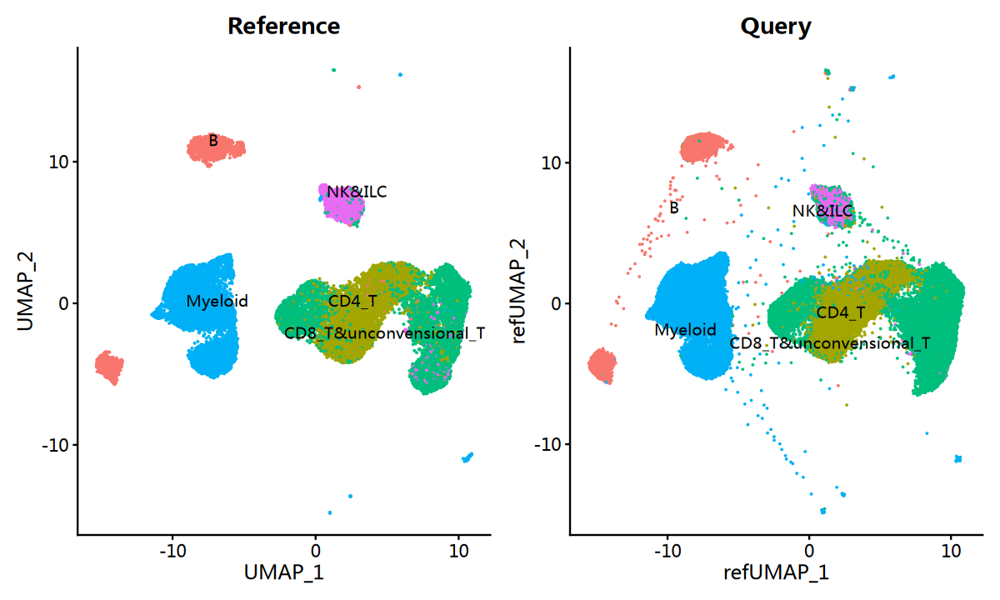

In [67]:
options(repr.plot.width=10, repr.plot.height=6)
p1 <- DimPlot(pbmc.multi, reduction = "umap", group.by = "l1_annotation", label = TRUE, repel = TRUE,raster=FALSE) + NoLegend() + ggtitle("Reference")
p2 <- DimPlot(pbmc.atac, reduction = "ref.umap", group.by = "predicted.id", label = TRUE, repel = TRUE,raster=FALSE) + NoLegend() + ggtitle("Query")

p1 | p2

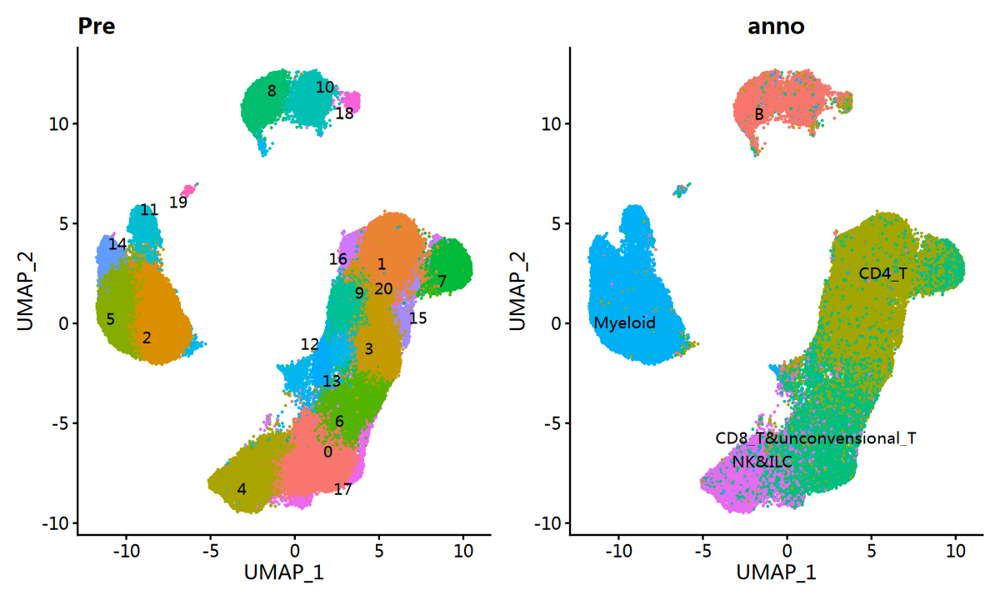

In [72]:
options(repr.plot.width=10, repr.plot.height=6)
p3 <- DimPlot(pbmc.atac, reduction = "umap", label = TRUE, repel = TRUE,raster=FALSE) + NoLegend() + ggtitle("Pre")
p4 <- DimPlot(pbmc.atac, reduction = "umap", group.by = "predicted.id", label = TRUE, repel = TRUE,raster=FALSE) + NoLegend() + ggtitle("anno")

p3 | p4

In [74]:
covid_meta <- pbmc.atac@meta.data

In [77]:
write.csv(covid_meta,"./output/covid_meta.csv")